In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperature
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperature
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperature
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    #print("Agg:")
    agg.columns = names
    #print(type(agg))
    #print(agg)

    #print("Test columns:")
    #print(agg.iloc[:, -36]) # Column containing response actual values (temperature) at time t

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    print(n_vars)
    print(len(data))
    print(type(data))

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    #print("Diff values:")
    #print(len(diff_values))
    #print(len(diff_values[0]))
    #print(len(diff_values_for_training))
    #print(len(diff_values_for_training[0]))
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    #print("Scaled values rows:")
    #print(len(scaled_values))

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        #print("Batch "+str(ws+1)+":")
        #print("Range: "+str(first)+"-"+str(last))
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
        #print("Supervised count:")
        #print(len(supervised_values))
        #print(len(supervised_values[0]))
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    print(n_vars)
    print(len(data))
    print(type(data))

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    #print("Diff values:")
    #print(len(diff_values))
    #print(len(diff_values[0]))
    #print(len(diff_values_for_training))
    #print(len(diff_values_for_training[0]))
    
    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        #print("Batch "+str(ws+1)+":")
        #print("Range: "+str(first)+"-"+str(last))
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
        #print("Supervised count:")
        #print(len(supervised_values))
        #print(len(supervised_values[0]))
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
    #print("Train_X Fold "+str(i)+":")
    #print(len(train_X[i]))
    #print(len(train_X[i][0]))
    #print(len(train_X[i][0][0])) 
    #print("Train_y Fold "+str(i)+":")
    #print(len(train_y[i]))
    #print(len(train_y[i][0]))
    #print(train_y[i][0][0])
    #print("Validation_X Fold "+str(i)+":")
    #print(len(val_X[i]))
    #print(len(val_X[i][0]))
    #print(len(val_X[i][0][0]))
    #print("Validation_y Fold "+str(i)+":")
    #print(len(val_y[i]))
    #print(len(val_y[i][0]))
    #print(val_y[i][0][0])
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
     

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + 12*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]


Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
12
84
<class 'list'>
12
21
<class 'list'>
(84, 1, 1, 2160)
(11, 1, 1, 2160)
(10, 1, 1, 2160)
(84, 1, 2160)
(11, 1, 2160)
(10, 1, 2160)
(84, 2160)
(11, 2160)
(10, 2160)
[[0.39307412 0.69695044 0.32924264 ... 0.28675577 0.28888214 0.44896719]
 [0.45747266 0.51683609 0.42215989 ... 0.44744836 0.28584447 0.55801944]
 [0.38487242 0.62674714 0.3411641  ... 0.35905225 0.21111786 0.59720535]
 ...
 [0.54100851 0.46473952 0.46949509 ... 0.33961118 0.4845079  0.34568651]
 [0.44896719 0.51620076 0.3997195  ... 0.41585662 0.27855407 0.57776428]
 [0.46780073 0.52414231 0.42356241 ... 0.48876063 0.37788578 0.5227825 ]]
Fold 2:
12
84
<class 'list'>
12
21
<class 'list'>
(84, 1, 1, 2160)
(11, 1, 1, 2160)
(10, 1, 1, 2160)
(84, 1, 2160)
(11, 1, 2160)
(10, 1, 2160)
(84, 2160)
(11, 2160)
(10, 2160)
[[0.38166311 0.

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 2160)
(11, 2160)


In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    #print("Forecasts:")
    #print(forecasts)
    #print("Actual:")
    #print(actual)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

[I 2025-05-23 11:28:18,267] A new study created in memory with name: no-name-2dcdc2ba-35dc-4264-8eb3-4105b9b970b3
[I 2025-05-23 11:29:30,886] Trial 0 finished with value: 0.07269023731350899 and parameters: {'lr': 0.04496236607558223, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3057746428219261}. Best is trial 0 with value: 0.07269023731350899.


Cross Validation Accuracies:
[0.07499044388532639, 0.06075912341475487, 0.06576396524906158, 0.09203331172466278, 0.06990434229373932]
Mean Cross Validation Accuracy:
0.07269023731350899
Standard Deviation of Cross Validation Accuracy:
0.010747384915275254


[I 2025-05-23 11:32:05,371] Trial 1 finished with value: 21.894816589355468 and parameters: {'lr': 0.26408387088998303, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.37111159730278354}. Best is trial 0 with value: 0.07269023731350899.


Cross Validation Accuracies:
[29.629554748535156, 18.491230010986328, 23.602802276611328, 22.197986602783203, 15.552509307861328]
Mean Cross Validation Accuracy:
21.894816589355468
Standard Deviation of Cross Validation Accuracy:
4.788414451680873


[I 2025-05-23 11:34:08,149] Trial 2 finished with value: 0.06517126336693764 and parameters: {'lr': 0.06719125173417939, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1306918238557732}. Best is trial 2 with value: 0.06517126336693764.


Cross Validation Accuracies:
[0.05638575553894043, 0.05180748924612999, 0.06673964858055115, 0.08375534415245056, 0.06716807931661606]
Mean Cross Validation Accuracy:
0.06517126336693764
Standard Deviation of Cross Validation Accuracy:
0.01102352730577115


[I 2025-05-23 11:36:49,270] Trial 3 finished with value: 0.06539131179451943 and parameters: {'lr': 0.014746853283237566, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2000582916320379}. Best is trial 2 with value: 0.06517126336693764.


Cross Validation Accuracies:
[0.05243416875600815, 0.050818804651498795, 0.07057629525661469, 0.07929827272891998, 0.07382901757955551]
Mean Cross Validation Accuracy:
0.06539131179451943
Standard Deviation of Cross Validation Accuracy:
0.011590755066015366


[I 2025-05-23 11:38:51,031] Trial 4 finished with value: 0.07699653580784797 and parameters: {'lr': 0.15327061769017186, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.22197548895806093}. Best is trial 2 with value: 0.06517126336693764.


Cross Validation Accuracies:
[0.05785607919096947, 0.07532981038093567, 0.10063331574201584, 0.07625889778137207, 0.07490457594394684]
Mean Cross Validation Accuracy:
0.07699653580784797
Standard Deviation of Cross Validation Accuracy:
0.01365835147254515


[I 2025-05-23 11:42:35,016] Trial 5 finished with value: 2.273927903175354 and parameters: {'lr': 0.7907234722035261, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3211172345547447}. Best is trial 2 with value: 0.06517126336693764.


Cross Validation Accuracies:
[2.258164405822754, 1.211487889289856, 2.265129566192627, 3.1812212467193604, 2.453636407852173]
Mean Cross Validation Accuracy:
2.273927903175354
Standard Deviation of Cross Validation Accuracy:
0.6300128632940608


[I 2025-05-23 11:44:28,708] Trial 6 finished with value: 0.06585547477006912 and parameters: {'lr': 0.004598394170166252, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.12194001047505268}. Best is trial 2 with value: 0.06517126336693764.


Cross Validation Accuracies:
[0.05354634299874306, 0.0512029267847538, 0.07234857976436615, 0.09071602672338486, 0.06146349757909775]
Mean Cross Validation Accuracy:
0.06585547477006912
Standard Deviation of Cross Validation Accuracy:
0.014461734383968786


[I 2025-05-23 11:49:51,483] Trial 7 finished with value: 3.094473361968994 and parameters: {'lr': 0.2789663643340179, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.30265218234426994}. Best is trial 2 with value: 0.06517126336693764.


Cross Validation Accuracies:
[2.4047443866729736, 4.000141620635986, 2.26442289352417, 3.28408145904541, 3.5189764499664307]
Mean Cross Validation Accuracy:
3.094473361968994
Standard Deviation of Cross Validation Accuracy:
0.6634906082954862


[I 2025-05-23 11:51:23,809] Trial 8 finished with value: 11.764048194885254 and parameters: {'lr': 0.1717969949034468, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2696834314017166}. Best is trial 2 with value: 0.06517126336693764.


Cross Validation Accuracies:
[7.841096878051758, 14.013806343078613, 12.829051971435547, 13.26944351196289, 10.866842269897461]
Mean Cross Validation Accuracy:
11.764048194885254
Standard Deviation of Cross Validation Accuracy:
2.2206478935746183


[I 2025-05-23 11:53:57,627] Trial 9 finished with value: 0.07732849717140197 and parameters: {'lr': 0.04730133837430193, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2624873214291448}. Best is trial 2 with value: 0.06517126336693764.


Cross Validation Accuracies:
[0.06992880254983902, 0.08180893212556839, 0.08550138771533966, 0.08975505083799362, 0.059648312628269196]
Mean Cross Validation Accuracy:
0.07732849717140197
Standard Deviation of Cross Validation Accuracy:
0.011032987620966531


[I 2025-05-23 11:55:33,655] Trial 10 finished with value: 0.07769351527094841 and parameters: {'lr': 0.0011632246346335378, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4629814884081936}. Best is trial 2 with value: 0.06517126336693764.


Cross Validation Accuracies:
[0.060253869742155075, 0.06773004680871964, 0.0747002437710762, 0.09134891629219055, 0.09443449974060059]
Mean Cross Validation Accuracy:
0.07769351527094841
Standard Deviation of Cross Validation Accuracy:
0.013259729652627252


[I 2025-05-23 11:57:18,798] Trial 11 finished with value: 0.06446110531687736 and parameters: {'lr': 0.009919543271415325, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10558252239314139}. Best is trial 11 with value: 0.06446110531687736.


Cross Validation Accuracies:
[0.05180812254548073, 0.060619886964559555, 0.07226326316595078, 0.08239836245775223, 0.05521589145064354]
Mean Cross Validation Accuracy:
0.06446110531687736
Standard Deviation of Cross Validation Accuracy:
0.011339715796399568


[I 2025-05-23 11:59:11,284] Trial 12 finished with value: 0.060880310088396075 and parameters: {'lr': 0.012591909890797972, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10956863572132311}. Best is trial 12 with value: 0.060880310088396075.


Cross Validation Accuracies:
[0.05183115974068642, 0.04987390339374542, 0.07078901678323746, 0.07727666944265366, 0.05463080108165741]
Mean Cross Validation Accuracy:
0.060880310088396075
Standard Deviation of Cross Validation Accuracy:
0.011037278121051012


[I 2025-05-23 12:01:08,143] Trial 13 finished with value: 0.0653503641486168 and parameters: {'lr': 0.009319801215014184, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10714224107617137}. Best is trial 12 with value: 0.060880310088396075.


Cross Validation Accuracies:
[0.05593061447143555, 0.055796217173337936, 0.07011071592569351, 0.08249619603157043, 0.062418077141046524]
Mean Cross Validation Accuracy:
0.0653503641486168
Standard Deviation of Cross Validation Accuracy:
0.010052384945880045


[I 2025-05-23 12:02:52,478] Trial 14 finished with value: 0.07083789706230163 and parameters: {'lr': 0.002763147980130655, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.17299735913829553}. Best is trial 12 with value: 0.060880310088396075.


Cross Validation Accuracies:
[0.05981893837451935, 0.0694824680685997, 0.07149486243724823, 0.07699506729841232, 0.07639814913272858]
Mean Cross Validation Accuracy:
0.07083789706230163
Standard Deviation of Cross Validation Accuracy:
0.00620505262229151


[I 2025-05-23 12:04:40,119] Trial 15 finished with value: 0.06118697002530098 and parameters: {'lr': 0.020928016569175163, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16548533865375248}. Best is trial 12 with value: 0.060880310088396075.


Cross Validation Accuracies:
[0.05273033306002617, 0.05094663053750992, 0.06829023361206055, 0.07852812111377716, 0.055439531803131104]
Mean Cross Validation Accuracy:
0.06118697002530098
Standard Deviation of Cross Validation Accuracy:
0.010588523809877064


[I 2025-05-23 12:06:37,242] Trial 16 finished with value: 0.0610882043838501 and parameters: {'lr': 0.01906821564915191, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16906131057543966}. Best is trial 12 with value: 0.060880310088396075.


Cross Validation Accuracies:
[0.050371166318655014, 0.050651539117097855, 0.06942465901374817, 0.07831704616546631, 0.05667661130428314]
Mean Cross Validation Accuracy:
0.0610882043838501
Standard Deviation of Cross Validation Accuracy:
0.011041471869393768


[I 2025-05-23 12:08:36,014] Trial 17 finished with value: 0.0745471864938736 and parameters: {'lr': 0.003932622987700703, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2174310217241991}. Best is trial 12 with value: 0.060880310088396075.


Cross Validation Accuracies:
[0.08200739324092865, 0.04844224452972412, 0.06787681579589844, 0.07738301157951355, 0.09702646732330322]
Mean Cross Validation Accuracy:
0.0745471864938736
Standard Deviation of Cross Validation Accuracy:
0.016093330888498694


[I 2025-05-23 12:10:30,963] Trial 18 finished with value: 0.06025643721222877 and parameters: {'lr': 0.024347399446591023, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.49915512538930124}. Best is trial 18 with value: 0.06025643721222877.


Cross Validation Accuracies:
[0.05047205463051796, 0.049342814832925797, 0.06824859976768494, 0.07691197097301483, 0.05630674585700035]
Mean Cross Validation Accuracy:
0.06025643721222877
Standard Deviation of Cross Validation Accuracy:
0.010693201811566026


[I 2025-05-23 12:12:24,019] Trial 19 finished with value: 0.8086521863937378 and parameters: {'lr': 0.08974006191689173, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.4936919707485792}. Best is trial 18 with value: 0.06025643721222877.


Cross Validation Accuracies:
[0.9609501361846924, 0.6662418246269226, 0.3846544027328491, 0.8820295929908752, 1.1493849754333496]
Mean Cross Validation Accuracy:
0.8086521863937378
Standard Deviation of Cross Validation Accuracy:
0.26257668385599786


[I 2025-05-23 12:14:10,275] Trial 20 finished with value: 0.06452274098992347 and parameters: {'lr': 0.006982182808301921, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.40691774964533034}. Best is trial 18 with value: 0.06025643721222877.


Cross Validation Accuracies:
[0.058611296117305756, 0.04971581697463989, 0.07046675682067871, 0.08311327546834946, 0.06070655956864357]
Mean Cross Validation Accuracy:
0.06452274098992347
Standard Deviation of Cross Validation Accuracy:
0.011399058876120572


[I 2025-05-23 12:16:03,009] Trial 21 finished with value: 0.060337509214878085 and parameters: {'lr': 0.024452113520929804, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3638202183852467}. Best is trial 18 with value: 0.06025643721222877.


Cross Validation Accuracies:
[0.04918232932686806, 0.05136913061141968, 0.06705211848020554, 0.07719965279102325, 0.056884314864873886]
Mean Cross Validation Accuracy:
0.060337509214878085
Standard Deviation of Cross Validation Accuracy:
0.010451911479689158


[I 2025-05-23 12:17:58,163] Trial 22 finished with value: 0.060519909113645555 and parameters: {'lr': 0.02142722297850904, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4101780706144424}. Best is trial 18 with value: 0.06025643721222877.


Cross Validation Accuracies:
[0.05154012516140938, 0.04972976818680763, 0.0695062056183815, 0.07639072090387344, 0.055432725697755814]
Mean Cross Validation Accuracy:
0.060519909113645555
Standard Deviation of Cross Validation Accuracy:
0.01054115067636006


[I 2025-05-23 12:19:55,283] Trial 23 finished with value: 0.060722561180591585 and parameters: {'lr': 0.03255051197613031, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.42736233612648616}. Best is trial 18 with value: 0.06025643721222877.


Cross Validation Accuracies:
[0.051236990839242935, 0.04954436048865318, 0.06871297955513, 0.07795318216085434, 0.056165292859077454]
Mean Cross Validation Accuracy:
0.060722561180591585
Standard Deviation of Cross Validation Accuracy:
0.010921886239380391


[I 2025-05-23 12:21:46,620] Trial 24 finished with value: 0.06056891456246376 and parameters: {'lr': 0.028769217922355293, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.35370734632629086}. Best is trial 18 with value: 0.06025643721222877.


Cross Validation Accuracies:
[0.05151516571640968, 0.0496436208486557, 0.07000237703323364, 0.0766812115907669, 0.05500219762325287]
Mean Cross Validation Accuracy:
0.06056891456246376
Standard Deviation of Cross Validation Accuracy:
0.010778841107441811


[I 2025-05-23 12:25:14,332] Trial 25 finished with value: 0.060561373829841614 and parameters: {'lr': 0.06952471904557586, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4403134580450969}. Best is trial 18 with value: 0.06025643721222877.


Cross Validation Accuracies:
[0.05243254080414772, 0.05258999764919281, 0.06799115985631943, 0.07635346800088882, 0.053439702838659286]
Mean Cross Validation Accuracy:
0.060561373829841614
Standard Deviation of Cross Validation Accuracy:
0.009848156385701265


[I 2025-05-23 12:27:07,003] Trial 26 finished with value: 0.06085565462708473 and parameters: {'lr': 0.02232232049204739, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3855140748146604}. Best is trial 18 with value: 0.06025643721222877.


Cross Validation Accuracies:
[0.05220550671219826, 0.048813674598932266, 0.06921326369047165, 0.07913748919963837, 0.05490833893418312]
Mean Cross Validation Accuracy:
0.06085565462708473
Standard Deviation of Cross Validation Accuracy:
0.011482856878786706


[I 2025-05-23 12:29:06,790] Trial 27 finished with value: 0.06014902591705322 and parameters: {'lr': 0.041402719792426323, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.499667879780951}. Best is trial 27 with value: 0.06014902591705322.


Cross Validation Accuracies:
[0.048477932810783386, 0.04935264214873314, 0.07004775106906891, 0.07709155231714249, 0.05577525123953819]
Mean Cross Validation Accuracy:
0.06014902591705322
Standard Deviation of Cross Validation Accuracy:
0.011462462057957758


[I 2025-05-23 12:30:47,107] Trial 28 finished with value: 0.1034363940358162 and parameters: {'lr': 0.10586285547059793, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4978196101892593}. Best is trial 27 with value: 0.06014902591705322.


Cross Validation Accuracies:
[0.09330976754426956, 0.10902068018913269, 0.10533919185400009, 0.12575973570346832, 0.0837525948882103]
Mean Cross Validation Accuracy:
0.1034363940358162
Standard Deviation of Cross Validation Accuracy:
0.01430480330219417


[I 2025-05-23 12:34:10,099] Trial 29 finished with value: 0.43937587141990664 and parameters: {'lr': 0.04599922799597981, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4612250484481263}. Best is trial 27 with value: 0.06014902591705322.


Cross Validation Accuracies:
[0.3483084440231323, 0.5414847731590271, 0.27439045906066895, 0.5721057057380676, 0.4605899751186371]
Mean Cross Validation Accuracy:
0.43937587141990664
Standard Deviation of Cross Validation Accuracy:
0.1131432168114826


[I 2025-05-23 12:36:00,568] Trial 30 finished with value: 0.07137570530176163 and parameters: {'lr': 0.04247625115701875, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3388254399509495}. Best is trial 27 with value: 0.06014902591705322.


Cross Validation Accuracies:
[0.05444358289241791, 0.0591529980301857, 0.07925975322723389, 0.08947786688804626, 0.07454432547092438]
Mean Cross Validation Accuracy:
0.07137570530176163
Standard Deviation of Cross Validation Accuracy:
0.012930413465122933


[I 2025-05-23 12:38:07,687] Trial 31 finished with value: 0.06069750264286995 and parameters: {'lr': 0.03174784480949823, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3986653278335977}. Best is trial 27 with value: 0.06014902591705322.


Cross Validation Accuracies:
[0.05138891562819481, 0.050709549337625504, 0.0681467056274414, 0.07819484174251556, 0.055047500878572464]
Mean Cross Validation Accuracy:
0.06069750264286995
Standard Deviation of Cross Validation Accuracy:
0.010770134855677734


[I 2025-05-23 12:40:08,461] Trial 32 finished with value: 0.07506557181477547 and parameters: {'lr': 0.006486394096941735, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4771978461163945}. Best is trial 27 with value: 0.06014902591705322.


Cross Validation Accuracies:
[0.06241600587964058, 0.07690645754337311, 0.08325634151697159, 0.08740220963954926, 0.0653468444943428]
Mean Cross Validation Accuracy:
0.07506557181477547
Standard Deviation of Cross Validation Accuracy:
0.009768678318749748


[I 2025-05-23 12:42:10,081] Trial 33 finished with value: 0.061093829572200775 and parameters: {'lr': 0.016443264070390543, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.43041186516716456}. Best is trial 27 with value: 0.06014902591705322.


Cross Validation Accuracies:
[0.04973343759775162, 0.05339914560317993, 0.06890211254358292, 0.0762237086892128, 0.05721074342727661]
Mean Cross Validation Accuracy:
0.061093829572200775
Standard Deviation of Cross Validation Accuracy:
0.00993204460583731


[I 2025-05-23 12:44:01,793] Trial 34 finished with value: 0.06015997380018234 and parameters: {'lr': 0.061808878489608095, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3595511252087616}. Best is trial 27 with value: 0.06014902591705322.


Cross Validation Accuracies:
[0.049244608730077744, 0.051572203636169434, 0.0673101395368576, 0.07747022807598114, 0.05520268902182579]
Mean Cross Validation Accuracy:
0.06015997380018234
Standard Deviation of Cross Validation Accuracy:
0.010660576312114003


[I 2025-05-23 12:46:26,178] Trial 35 finished with value: 0.07217132747173309 and parameters: {'lr': 0.059453678713730154, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3782898558441483}. Best is trial 27 with value: 0.06014902591705322.


Cross Validation Accuracies:
[0.053433798253536224, 0.07235074043273926, 0.07711315155029297, 0.0882851704955101, 0.06967377662658691]
Mean Cross Validation Accuracy:
0.07217132747173309
Standard Deviation of Cross Validation Accuracy:
0.011326451453617853


[I 2025-05-23 12:48:20,964] Trial 36 finished with value: 0.05948358029127121 and parameters: {'lr': 0.13565087082646432, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3602411267669168}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.045708298683166504, 0.049513015896081924, 0.07343815267086029, 0.07323534786701202, 0.055523086339235306]
Mean Cross Validation Accuracy:
0.05948358029127121
Standard Deviation of Cross Validation Accuracy:
0.01173624515626445


[I 2025-05-23 12:49:54,061] Trial 37 finished with value: 2.105395460128784 and parameters: {'lr': 0.320885570089294, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.32557729585768647}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[1.0860447883605957, 2.510113477706909, 2.2201168537139893, 2.6924169063568115, 2.0182852745056152]
Mean Cross Validation Accuracy:
2.105395460128784
Standard Deviation of Cross Validation Accuracy:
0.5600385391566733


[I 2025-05-23 12:51:53,170] Trial 38 finished with value: 0.5794877469539642 and parameters: {'lr': 0.17289622100722976, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.27751481478406614}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.5276786684989929, 0.606050431728363, 0.4187946617603302, 0.5711334347724915, 0.7737815380096436]
Mean Cross Validation Accuracy:
0.5794877469539642
Standard Deviation of Cross Validation Accuracy:
0.11578591990103067


[I 2025-05-23 12:53:40,002] Trial 39 finished with value: 0.08728667944669724 and parameters: {'lr': 0.11244095449405393, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.46812604244061984}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.0929969847202301, 0.08223607391119003, 0.08884153515100479, 0.10296516120433807, 0.06939364224672318]
Mean Cross Validation Accuracy:
0.08728667944669724
Standard Deviation of Cross Validation Accuracy:
0.011193831777526256


[I 2025-05-23 12:56:15,954] Trial 40 finished with value: 0.061334538459777835 and parameters: {'lr': 0.8346251651030966, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.44335585003148026}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.05304562672972679, 0.05558384954929352, 0.0657556876540184, 0.0739312395453453, 0.05835628882050514]
Mean Cross Validation Accuracy:
0.061334538459777835
Standard Deviation of Cross Validation Accuracy:
0.007600919549165664


[I 2025-05-23 12:58:16,915] Trial 41 finished with value: 0.06538153365254402 and parameters: {'lr': 0.5537088444821268, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3435694352977946}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.06972188502550125, 0.04925325885415077, 0.06447956711053848, 0.07848839461803436, 0.06496456265449524]
Mean Cross Validation Accuracy:
0.06538153365254402
Standard Deviation of Cross Validation Accuracy:
0.00950512609951098


[I 2025-05-23 13:00:09,968] Trial 42 finished with value: 0.060757852345705035 and parameters: {'lr': 0.0798206746902106, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3636560912991302}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.052310336381196976, 0.05289064347743988, 0.06937248259782791, 0.07635844498872757, 0.052857354283332825]
Mean Cross Validation Accuracy:
0.060757852345705035
Standard Deviation of Cross Validation Accuracy:
0.010131749268269473


[I 2025-05-23 13:02:26,409] Trial 43 finished with value: 0.06181400716304779 and parameters: {'lr': 0.20870288439551285, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.30887551645877503}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.05715390294790268, 0.04745643958449364, 0.0718243271112442, 0.07361478358507156, 0.05902058258652687]
Mean Cross Validation Accuracy:
0.06181400716304779
Standard Deviation of Cross Validation Accuracy:
0.009748070255812941


[I 2025-05-23 13:04:43,226] Trial 44 finished with value: 0.06009299829602242 and parameters: {'lr': 0.051455922386865714, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2874274529678948}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.05029100552201271, 0.050369035452604294, 0.06806623935699463, 0.07791666686534882, 0.05382204428315163]
Mean Cross Validation Accuracy:
0.06009299829602242
Standard Deviation of Cross Validation Accuracy:
0.011056356671517267


[I 2025-05-23 13:06:35,670] Trial 45 finished with value: 0.06079183965921402 and parameters: {'lr': 0.05550312650208698, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2618517952240727}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.05208241939544678, 0.04903296381235123, 0.06866934895515442, 0.07947604358196259, 0.05469842255115509]
Mean Cross Validation Accuracy:
0.06079183965921402
Standard Deviation of Cross Validation Accuracy:
0.011510078396780086


[I 2025-05-23 13:08:10,362] Trial 46 finished with value: 5.355324935913086 and parameters: {'lr': 0.4332754324745649, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.28811030337112853}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[2.858565092086792, 3.970463752746582, 4.266582012176514, 12.549973487854004, 3.131040334701538]
Mean Cross Validation Accuracy:
5.355324935913086
Standard Deviation of Cross Validation Accuracy:
3.634485414512037


[I 2025-05-23 13:10:11,917] Trial 47 finished with value: 0.23984715044498445 and parameters: {'lr': 0.03790637281351837, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.32240361320905897}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.25181299448013306, 0.30493658781051636, 0.14355772733688354, 0.22875641286373138, 0.27017202973365784]
Mean Cross Validation Accuracy:
0.23984715044498445
Standard Deviation of Cross Validation Accuracy:
0.05421083295153232


[I 2025-05-23 13:13:25,822] Trial 48 finished with value: 0.059640397876501085 and parameters: {'lr': 0.12819063112106296, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24646246813491937}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.04604385793209076, 0.05374114215373993, 0.0673503503203392, 0.07783741503953934, 0.05322922393679619]
Mean Cross Validation Accuracy:
0.059640397876501085
Standard Deviation of Cross Validation Accuracy:
0.011413545182332972


[I 2025-05-23 13:16:53,539] Trial 49 finished with value: 0.06207037419080734 and parameters: {'lr': 0.1226489296071307, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.22474318388511838}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.04770265519618988, 0.053406987339258194, 0.07196801155805588, 0.07842110097408295, 0.058853115886449814]
Mean Cross Validation Accuracy:
0.06207037419080734
Standard Deviation of Cross Validation Accuracy:
0.011464256309414268


[I 2025-05-23 13:21:31,827] Trial 50 finished with value: 0.125876085460186 and parameters: {'lr': 0.22159373061995397, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.23908267022601232}. Best is trial 36 with value: 0.05948358029127121.


Cross Validation Accuracies:
[0.0972822830080986, 0.1396845132112503, 0.1401539444923401, 0.12564623355865479, 0.12661345303058624]
Mean Cross Validation Accuracy:
0.125876085460186
Standard Deviation of Cross Validation Accuracy:
0.015573901354496513


[I 2025-05-23 13:24:55,246] Trial 51 finished with value: 0.059444887936115264 and parameters: {'lr': 0.1567577714053969, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24744236008780432}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05327240005135536, 0.047673169523477554, 0.06789957731962204, 0.07587506622076035, 0.05250422656536102]
Mean Cross Validation Accuracy:
0.059444887936115264
Standard Deviation of Cross Validation Accuracy:
0.010642163993983803


[I 2025-05-23 13:28:28,509] Trial 52 finished with value: 0.06248815208673477 and parameters: {'lr': 0.14874944018158057, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24752747119683946}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05433553084731102, 0.05868269503116608, 0.06742782145738602, 0.07778766006231308, 0.054207053035497665]
Mean Cross Validation Accuracy:
0.06248815208673477
Standard Deviation of Cross Validation Accuracy:
0.009033256508677425


[I 2025-05-23 13:32:21,699] Trial 53 finished with value: 0.05983317047357559 and parameters: {'lr': 0.08970208382686233, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.18844979070551887}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04961018264293671, 0.04581814631819725, 0.06789351999759674, 0.08122579753398895, 0.05461820587515831]
Mean Cross Validation Accuracy:
0.05983317047357559
Standard Deviation of Cross Validation Accuracy:
0.013044078848422317


[I 2025-05-23 13:36:19,556] Trial 54 finished with value: 0.06291106566786767 and parameters: {'lr': 0.29997014896402224, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.18683460260201895}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.059215568006038666, 0.057850562036037445, 0.06406406313180923, 0.07655597478151321, 0.05686916038393974]
Mean Cross Validation Accuracy:
0.06291106566786767
Standard Deviation of Cross Validation Accuracy:
0.0072564863027199285


[I 2025-05-23 13:39:33,280] Trial 55 finished with value: 0.06096067503094673 and parameters: {'lr': 0.08415186934275773, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.20394509550703355}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05226210504770279, 0.049082398414611816, 0.06952915340662003, 0.07808686792850494, 0.05584285035729408]
Mean Cross Validation Accuracy:
0.06096067503094673
Standard Deviation of Cross Validation Accuracy:
0.01104242735413336


[I 2025-05-23 13:42:50,000] Trial 56 finished with value: 0.0618479423224926 and parameters: {'lr': 0.14955221375530758, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.13522097733018354}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05531531944870949, 0.05312909185886383, 0.0663067027926445, 0.07869616150856018, 0.055792436003685]
Mean Cross Validation Accuracy:
0.0618479423224926
Standard Deviation of Cross Validation Accuracy:
0.009582334856049205


[I 2025-05-23 13:46:06,684] Trial 57 finished with value: 0.06250809133052826 and parameters: {'lr': 0.10181440195152576, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2881986810429054}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04907858744263649, 0.05312414467334747, 0.07297784835100174, 0.07868190109729767, 0.058677975088357925]
Mean Cross Validation Accuracy:
0.06250809133052826
Standard Deviation of Cross Validation Accuracy:
0.011439298531008366


[I 2025-05-23 13:48:29,940] Trial 58 finished with value: 0.07310547530651093 and parameters: {'lr': 0.13209791102409152, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25049310363876315}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.06336327642202377, 0.06924305111169815, 0.06593938171863556, 0.08501636236906052, 0.08196530491113663]
Mean Cross Validation Accuracy:
0.07310547530651093
Standard Deviation of Cross Validation Accuracy:
0.008735530531290924


[I 2025-05-23 13:51:31,337] Trial 59 finished with value: 0.06243604719638825 and parameters: {'lr': 0.2012907976855002, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.13965519672113547}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05177655443549156, 0.05715036019682884, 0.06404196470975876, 0.08399506658315659, 0.055216290056705475]
Mean Cross Validation Accuracy:
0.06243604719638825
Standard Deviation of Cross Validation Accuracy:
0.011498334262941948


[I 2025-05-23 13:54:39,403] Trial 60 finished with value: 0.06839592903852462 and parameters: {'lr': 0.37743114641167064, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2234520559713251}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.06053227558732033, 0.0689353346824646, 0.0756998360157013, 0.08360642194747925, 0.05320577695965767]
Mean Cross Validation Accuracy:
0.06839592903852462
Standard Deviation of Cross Validation Accuracy:
0.010747789315883213


[I 2025-05-23 13:57:50,274] Trial 61 finished with value: 0.061153265088796614 and parameters: {'lr': 0.06694535211235439, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.29887490948551354}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05329832807183266, 0.04759036377072334, 0.06661557406187057, 0.08016759157180786, 0.05809446796774864]
Mean Cross Validation Accuracy:
0.061153265088796614
Standard Deviation of Cross Validation Accuracy:
0.011370048359192345


[I 2025-05-23 14:01:03,681] Trial 62 finished with value: 0.06041455790400505 and parameters: {'lr': 0.05378649420397683, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.15249660373870844}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.0519784651696682, 0.050510749220848083, 0.06724981963634491, 0.07671867311000824, 0.05561508238315582]
Mean Cross Validation Accuracy:
0.06041455790400505
Standard Deviation of Cross Validation Accuracy:
0.010048214049574695


[I 2025-05-23 14:04:34,077] Trial 63 finished with value: 0.06082456111907959 and parameters: {'lr': 0.07942613107312585, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.20211019870154168}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05038353055715561, 0.04680626094341278, 0.07008462399244308, 0.07957111299037933, 0.05727727711200714]
Mean Cross Validation Accuracy:
0.06082456111907959
Standard Deviation of Cross Validation Accuracy:
0.0122905903382949


[I 2025-05-23 14:06:04,168] Trial 64 finished with value: 0.06052405834197998 and parameters: {'lr': 0.03949072375247004, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2713847678685891}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05256425961852074, 0.04682740196585655, 0.06772403419017792, 0.07707739621400833, 0.058427199721336365]
Mean Cross Validation Accuracy:
0.06052405834197998
Standard Deviation of Cross Validation Accuracy:
0.010781523589908016


[I 2025-05-23 14:09:11,885] Trial 65 finished with value: 0.061953389644622804 and parameters: {'lr': 0.2578553276801165, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1841813202524215}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05063904449343681, 0.04843037948012352, 0.07035254687070847, 0.07730438560247421, 0.063040591776371]
Mean Cross Validation Accuracy:
0.061953389644622804
Standard Deviation of Cross Validation Accuracy:
0.011119956273215034


[I 2025-05-23 14:11:00,994] Trial 66 finished with value: 0.062343084067106244 and parameters: {'lr': 0.09897534983960228, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3090470927114367}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05306201055645943, 0.049969639629125595, 0.07320753484964371, 0.0786488950252533, 0.05682734027504921]
Mean Cross Validation Accuracy:
0.062343084067106244
Standard Deviation of Cross Validation Accuracy:
0.01143310670079176


[I 2025-05-23 14:12:43,794] Trial 67 finished with value: 0.18990973830223085 and parameters: {'lr': 0.07005104761406966, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2591420751758132}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.255320280790329, 0.15918047726154327, 0.21072091162204742, 0.15795014798641205, 0.16637687385082245]
Mean Cross Validation Accuracy:
0.18990973830223085
Standard Deviation of Cross Validation Accuracy:
0.03802931135344103


[I 2025-05-23 14:14:28,093] Trial 68 finished with value: 0.060070537775754926 and parameters: {'lr': 0.04873168927831676, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.236388108582499}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05019131675362587, 0.05058163031935692, 0.06769625842571259, 0.0766010731458664, 0.055282410234212875]
Mean Cross Validation Accuracy:
0.060070537775754926
Standard Deviation of Cross Validation Accuracy:
0.010411289575532253


[I 2025-05-23 14:16:55,032] Trial 69 finished with value: 0.17161733508110047 and parameters: {'lr': 0.0016492508780712087, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.23666756831182917}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.15801496803760529, 0.21097327768802643, 0.1688157469034195, 0.1899348646402359, 0.1303478181362152]
Mean Cross Validation Accuracy:
0.17161733508110047
Standard Deviation of Cross Validation Accuracy:
0.02749715775129098


[I 2025-05-23 14:18:42,880] Trial 70 finished with value: 0.06072305366396904 and parameters: {'lr': 0.028972636599159066, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.211573928761271}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04974214732646942, 0.04808400943875313, 0.06896226853132248, 0.08056747168302536, 0.05625937134027481]
Mean Cross Validation Accuracy:
0.06072305366396904
Standard Deviation of Cross Validation Accuracy:
0.012344519358421603


[I 2025-05-23 14:20:25,762] Trial 71 finished with value: 0.0597952701151371 and parameters: {'lr': 0.04598287243434249, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.28662144486761176}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.0491458922624588, 0.048153314739465714, 0.06863900274038315, 0.07791339606046677, 0.05512474477291107]
Mean Cross Validation Accuracy:
0.0597952701151371
Standard Deviation of Cross Validation Accuracy:
0.011638180915489188


[I 2025-05-23 14:22:10,559] Trial 72 finished with value: 0.059685397893190384 and parameters: {'lr': 0.03614995467478203, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2824795771058542}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04965823516249657, 0.0490947850048542, 0.06845523416996002, 0.07622912526130676, 0.054989609867334366]
Mean Cross Validation Accuracy:
0.059685397893190384
Standard Deviation of Cross Validation Accuracy:
0.010819985605481072


[I 2025-05-23 14:23:54,054] Trial 73 finished with value: 0.06140923202037811 and parameters: {'lr': 0.05033860316381646, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.28095411451226804}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04907453432679176, 0.05233529582619667, 0.06937481462955475, 0.07892263680696487, 0.05733887851238251]
Mean Cross Validation Accuracy:
0.06140923202037811
Standard Deviation of Cross Validation Accuracy:
0.011146467749477858


[I 2025-05-23 14:25:37,097] Trial 74 finished with value: 0.06289695277810096 and parameters: {'lr': 0.013143266118286433, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2963330167127605}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05579151213169098, 0.050421569496393204, 0.0706801488995552, 0.08076424151659012, 0.05682729184627533]
Mean Cross Validation Accuracy:
0.06289695277810096
Standard Deviation of Cross Validation Accuracy:
0.011160478550331619


[I 2025-05-23 14:27:21,761] Trial 75 finished with value: 0.06037125885486603 and parameters: {'lr': 0.03636200935870748, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.23213567075494454}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04996737092733383, 0.048189714550971985, 0.07160632312297821, 0.07771743088960648, 0.054375454783439636]
Mean Cross Validation Accuracy:
0.06037125885486603
Standard Deviation of Cross Validation Accuracy:
0.011997474113051795


[I 2025-05-23 14:29:07,889] Trial 76 finished with value: 1.0232904195785522 and parameters: {'lr': 0.12082704472858259, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.25286403074236485}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.6960597634315491, 1.1317424774169922, 1.4427416324615479, 1.206964135169983, 0.6389440894126892]
Mean Cross Validation Accuracy:
1.0232904195785522
Standard Deviation of Cross Validation Accuracy:
0.30862248993614677


[I 2025-05-23 14:31:21,289] Trial 77 finished with value: 0.06391111612319947 and parameters: {'lr': 0.02700160611999534, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2679585323665936}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.06385236978530884, 0.05246329680085182, 0.06616882979869843, 0.08456383645534515, 0.052507247775793076]
Mean Cross Validation Accuracy:
0.06391111612319947
Standard Deviation of Cross Validation Accuracy:
0.01177061051783354


[I 2025-05-23 14:32:40,696] Trial 78 finished with value: 0.06025470793247223 and parameters: {'lr': 0.04755659068931231, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3152948968483694}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05070743337273598, 0.048688992857933044, 0.06832368671894073, 0.0776066705584526, 0.05594675615429878]
Mean Cross Validation Accuracy:
0.06025470793247223
Standard Deviation of Cross Validation Accuracy:
0.011042406357831398


[I 2025-05-23 14:34:25,040] Trial 79 finished with value: 0.06370610520243644 and parameters: {'lr': 0.01853418596055714, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.18505866037706353}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05065351352095604, 0.051900044083595276, 0.08112328499555588, 0.07816588878631592, 0.056687794625759125]
Mean Cross Validation Accuracy:
0.06370610520243644
Standard Deviation of Cross Validation Accuracy:
0.01320191959780428


[I 2025-05-23 14:36:05,087] Trial 80 finished with value: 0.06298967227339744 and parameters: {'lr': 0.17312583120243513, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.24455326838911476}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.0553133487701416, 0.05146198347210884, 0.07359042763710022, 0.07979236543178558, 0.05479023605585098]
Mean Cross Validation Accuracy:
0.06298967227339744
Standard Deviation of Cross Validation Accuracy:
0.011434603775974243


[I 2025-05-23 14:37:48,563] Trial 81 finished with value: 0.061253903061151506 and parameters: {'lr': 0.08970129517203754, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.27915786896348377}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04862157255411148, 0.05028723180294037, 0.06730258464813232, 0.08085426688194275, 0.0592038594186306]
Mean Cross Validation Accuracy:
0.061253903061151506
Standard Deviation of Cross Validation Accuracy:
0.011872717821198918


[I 2025-05-23 14:39:29,084] Trial 82 finished with value: 0.06047766730189323 and parameters: {'lr': 0.045903252615214225, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3329504921276272}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05095735564827919, 0.04810025915503502, 0.07038301229476929, 0.07731030136346817, 0.055637408047914505]
Mean Cross Validation Accuracy:
0.06047766730189323
Standard Deviation of Cross Validation Accuracy:
0.011390505738906993


[I 2025-05-23 14:41:10,531] Trial 83 finished with value: 0.06045978665351868 and parameters: {'lr': 0.0331113935136797, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2909962766151103}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05018709972500801, 0.049921151250600815, 0.0685853660106659, 0.07805493474006653, 0.055550381541252136]
Mean Cross Validation Accuracy:
0.06045978665351868
Standard Deviation of Cross Validation Accuracy:
0.011102319284906393


[I 2025-05-23 14:42:53,515] Trial 84 finished with value: 0.06066156178712845 and parameters: {'lr': 0.06473377529543388, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.25788077918184865}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.048792336136102676, 0.05354001373052597, 0.06702602654695511, 0.07766920328140259, 0.0562802292406559]
Mean Cross Validation Accuracy:
0.06066156178712845
Standard Deviation of Cross Validation Accuracy:
0.010397666276978476


[I 2025-05-23 14:44:31,464] Trial 85 finished with value: 0.060124099254608154 and parameters: {'lr': 0.07696745573944803, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.21628363512219625}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05164255201816559, 0.04669177159667015, 0.06825695186853409, 0.07806713134050369, 0.05596208944916725]
Mean Cross Validation Accuracy:
0.060124099254608154
Standard Deviation of Cross Validation Accuracy:
0.011469804597551935


[I 2025-05-23 14:46:15,265] Trial 86 finished with value: 0.06235369220376015 and parameters: {'lr': 0.13480889766685486, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.21236010876727324}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04364604130387306, 0.05176135525107384, 0.08635859936475754, 0.07559546828269958, 0.05440699681639671]
Mean Cross Validation Accuracy:
0.06235369220376015
Standard Deviation of Cross Validation Accuracy:
0.01598063811882185


[I 2025-05-23 14:48:34,140] Trial 87 finished with value: 0.06542686074972152 and parameters: {'lr': 0.07746943030928123, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.228361537491128}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04972560703754425, 0.05854250490665436, 0.07101945579051971, 0.08200603723526001, 0.0658406987786293]
Mean Cross Validation Accuracy:
0.06542686074972152
Standard Deviation of Cross Validation Accuracy:
0.010956652752107247


[I 2025-05-23 14:50:15,695] Trial 88 finished with value: 0.0614861361682415 and parameters: {'lr': 0.0589889595210087, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.19650980662499642}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04980967193841934, 0.0509527213871479, 0.07332619279623032, 0.07700874656438828, 0.05633334815502167]
Mean Cross Validation Accuracy:
0.0614861361682415
Standard Deviation of Cross Validation Accuracy:
0.011445367994386247


[I 2025-05-23 14:54:27,390] Trial 89 finished with value: 0.07987807542085648 and parameters: {'lr': 0.10299905670131787, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.26725672198689304}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.06270773708820343, 0.08445466309785843, 0.07758419215679169, 0.08780951052904129, 0.08683427423238754]
Mean Cross Validation Accuracy:
0.07987807542085648
Standard Deviation of Cross Validation Accuracy:
0.009298644400482364


[I 2025-05-23 14:56:10,971] Trial 90 finished with value: 1.6680420160293579 and parameters: {'lr': 0.18719109427401442, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.17356300196676475}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[1.9191797971725464, 1.3615061044692993, 1.393085241317749, 2.279435873031616, 1.3870030641555786]
Mean Cross Validation Accuracy:
1.6680420160293579
Standard Deviation of Cross Validation Accuracy:
0.3702488403773065


[I 2025-05-23 14:57:49,452] Trial 91 finished with value: 0.059852969646453855 and parameters: {'lr': 0.04103146217543704, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2396551033171461}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04918612539768219, 0.04806976020336151, 0.0696222111582756, 0.07728736847639084, 0.05509938299655914]
Mean Cross Validation Accuracy:
0.059852969646453855
Standard Deviation of Cross Validation Accuracy:
0.011615666311693017


[I 2025-05-23 14:59:33,602] Trial 92 finished with value: 0.06030154973268509 and parameters: {'lr': 0.02362626700150458, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.24129443992533656}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05258028209209442, 0.04784984514117241, 0.06708932667970657, 0.07735145092010498, 0.05663684383034706]
Mean Cross Validation Accuracy:
0.06030154973268509
Standard Deviation of Cross Validation Accuracy:
0.010628885519619262


[I 2025-05-23 15:01:12,598] Trial 93 finished with value: 0.06047631278634071 and parameters: {'lr': 0.03585451185721754, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2204584268268683}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05131852999329567, 0.04843484237790108, 0.06892497092485428, 0.07870924472808838, 0.05499397590756416]
Mean Cross Validation Accuracy:
0.06047631278634071
Standard Deviation of Cross Validation Accuracy:
0.011512928771326491


[I 2025-05-23 15:02:56,168] Trial 94 finished with value: 0.06272514015436173 and parameters: {'lr': 0.23426696020706256, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2754794589648886}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.05072202906012535, 0.05909181758761406, 0.07182832807302475, 0.07726355642080307, 0.054719969630241394]
Mean Cross Validation Accuracy:
0.06272514015436173
Standard Deviation of Cross Validation Accuracy:
0.0101547234502342


[I 2025-05-23 15:04:37,667] Trial 95 finished with value: 0.05977683365345001 and parameters: {'lr': 0.07351818495063865, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2120480827767112}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04988037049770355, 0.04780569300055504, 0.06690753251314163, 0.07977277040481567, 0.054517801851034164]
Mean Cross Validation Accuracy:
0.05977683365345001
Standard Deviation of Cross Validation Accuracy:
0.011996582511827995


[I 2025-05-23 15:06:00,238] Trial 96 finished with value: 0.06171795874834061 and parameters: {'lr': 0.054372758399080706, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23429637080904814}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.050183895975351334, 0.051239725202322006, 0.06909727305173874, 0.07932424545288086, 0.058744654059410095]
Mean Cross Validation Accuracy:
0.06171795874834061
Standard Deviation of Cross Validation Accuracy:
0.01110048768460368


[I 2025-05-23 15:09:02,001] Trial 97 finished with value: 0.06371828019618989 and parameters: {'lr': 0.15146110533807783, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.19242677939611447}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.056471940129995346, 0.05763208866119385, 0.07399135828018188, 0.0772324800491333, 0.05326353386044502]
Mean Cross Validation Accuracy:
0.06371828019618989
Standard Deviation of Cross Validation Accuracy:
0.00986937306707429


[I 2025-05-23 15:10:42,817] Trial 98 finished with value: 0.19507477283477784 and parameters: {'lr': 0.08850733054989693, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.25261544904357647}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.2106981873512268, 0.22989267110824585, 0.17121733725070953, 0.20142702758312225, 0.16213864088058472]
Mean Cross Validation Accuracy:
0.19507477283477784
Standard Deviation of Cross Validation Accuracy:
0.025102566731209815


[I 2025-05-23 15:12:25,669] Trial 99 finished with value: 0.06111670807003975 and parameters: {'lr': 0.03998576392266879, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.28535284811487516}. Best is trial 51 with value: 0.059444887936115264.


Cross Validation Accuracies:
[0.04995071515440941, 0.05147599056363106, 0.06948443502187729, 0.07752422988414764, 0.05714816972613335]
Mean Cross Validation Accuracy:
0.06111670807003975
Standard Deviation of Cross Validation Accuracy:
0.010701380797245485
Number of finished trials: 100
Best trial: {'lr': 0.1567577714053969, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24744236008780432}
Best hyperparameters:  {'lr': 0.1567577714053969, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24744236008780432}
Fold 1:
Epoch 1/100
84/84 [==============================] - 15s 95ms/step - loss: 33.7024 - val_loss: 0.1000
Epoch 2/100
84/84 [==============================] - 6s 74ms/step - loss: 0.0849 - val_loss: 0.1049
Epoch 3/100
84/84 [==============================] - 6s 71ms/step - loss: 0.0878 - val_loss: 0.0962
Epoch 4/100
84/84 [==============================] - 5s 63ms/step - loss: 0.0860 - val_loss: 0.

NameError: name 'make_forecasts' is not defined

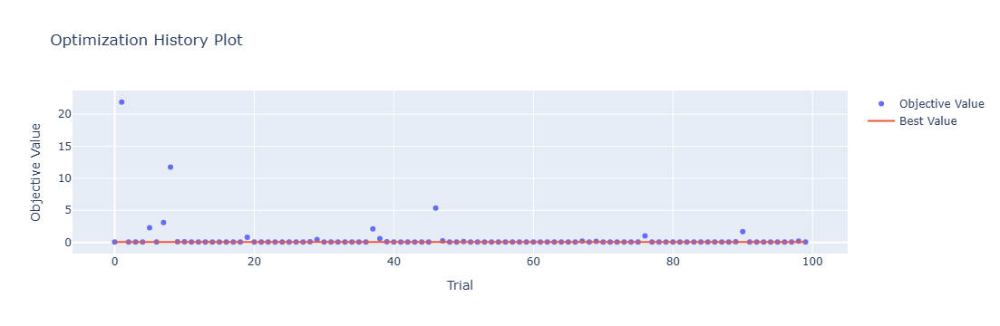

In [4]:
optuna.visualization.plot_optimization_history(study)

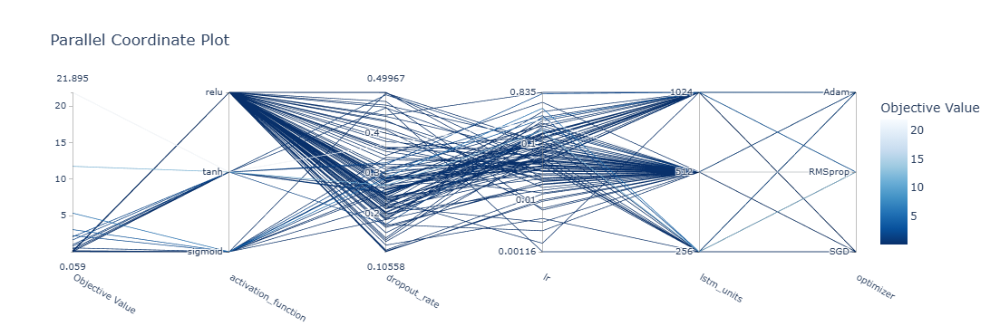

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

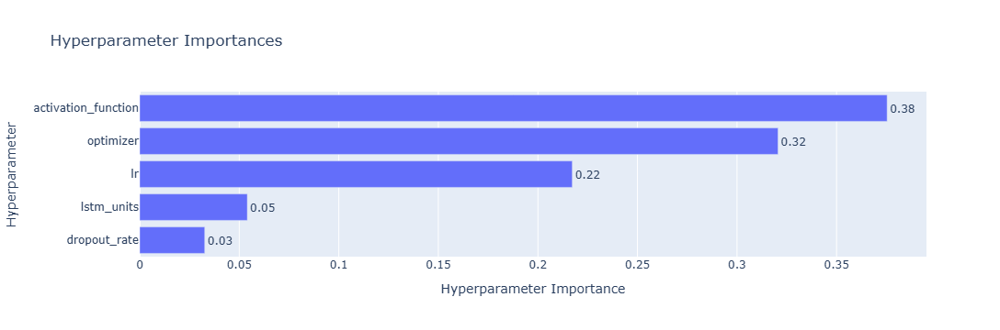

In [6]:
optuna.visualization.plot_param_importances(study)

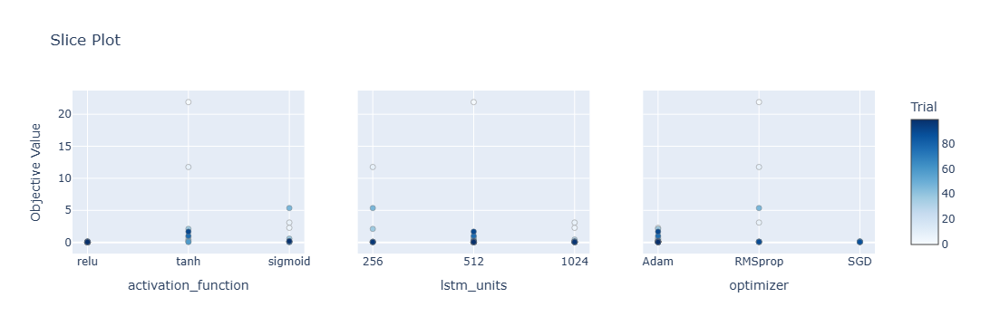

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

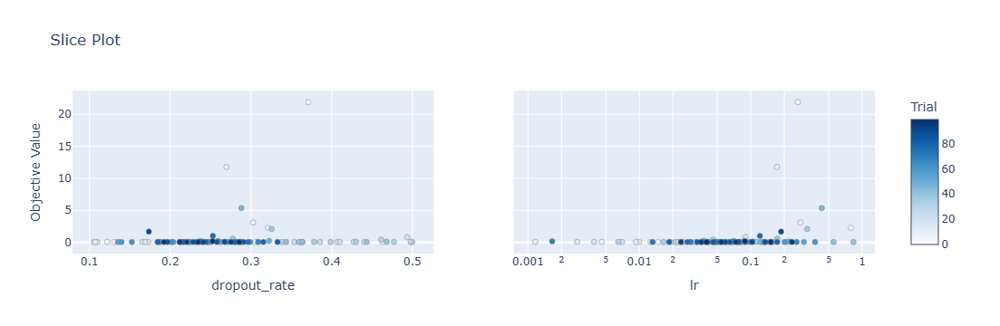

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 25s 132ms/step - loss: 29.9105 - accuracy: 0.3810 - mae: 29.6137 - rmse: 29.9105 - mape: 6007.3521 - pearson: 0.5265 - val_loss: 0.1797 - val_accuracy: 0.0000e+00 - val_mae: 0.1459 - val_rmse: 0.1797 - val_mape: 32.0438 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 7s 88ms/step - loss: 1.0224 - accuracy: 0.5952 - mae: 0.9494 - rmse: 1.0224 - mape: 202.5775 - pearson: 0.6861 - val_loss: 0.1907 - val_accuracy: 0.0000e+00 - val_mae: 0.1616 - val_rmse: 0.1907 - val_mape: 35.8400 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 7s 78ms/step - loss: 0.0861 - accuracy: 0.5714 - mae: 0.0680 - rmse: 0.0861 - mape: 14.8131 - pearson: 0.7564 - val_loss: 0.1355 - val_accuracy: 0.0000e+00 - val_mae: 0.1148 - val_rmse: 0.1355 - val_mape: 25.3997 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 8s 92ms/step - loss: 0.0860 - accuracy: 0.6786 - mae: 0.0680 - rmse: 0.0860 - mape: 

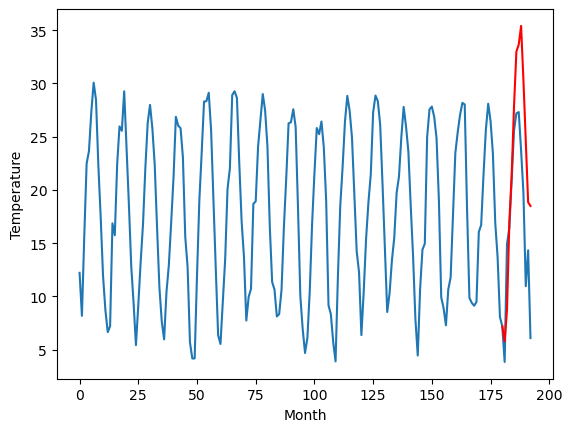

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		4.78		-3.75
8.44		7.75		-0.69
13.50		15.98		2.48
14.90		20.45		5.55
18.92		26.94		8.02
22.40		32.02		9.62
23.62		32.68		9.06
23.96		34.43		10.47
21.83		29.32		7.49
19.20		23.59		4.39
13.69		17.87		4.18
13.45		17.51		4.06
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[13.23, 4.781240339279175, 7.749982948303223, 15.975415344238282, 20.45132791519165, 26.93703567504883, 32.02218114852906, 32.683255012035374, 34.429656560420995, 29.319085175991063, 23.593042905330663, 17.86633544683457, 17.513997758626942]


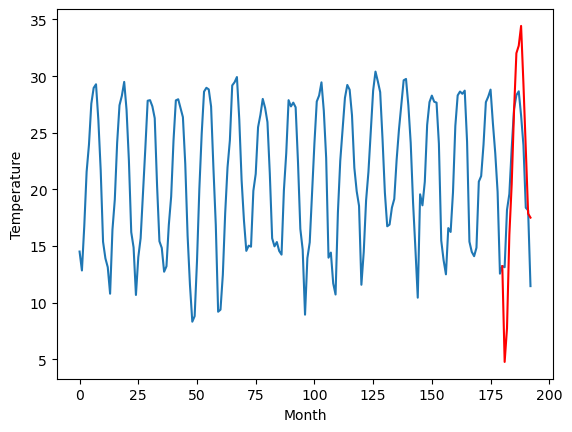

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.31		3.40		-3.91
8.17		6.37		-1.80
14.15		14.60		0.45
15.79		19.07		3.28
19.77		25.56		5.79
23.91		30.64		6.73
25.67		31.30		5.63
25.95		33.05		7.10
22.38		27.94		5.56
18.50		22.21		3.71
10.14		16.49		6.35
12.32		16.13		3.81
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.18, 3.401240339279175, 6.369982948303223, 14.595415344238281, 19.071327915191652, 25.55703567504883, 30.642181148529055, 31.303255012035372, 33.04965656042099, 27.93908517599106, 22.21304290533066, 16.486335446834566, 16.13399775862694]


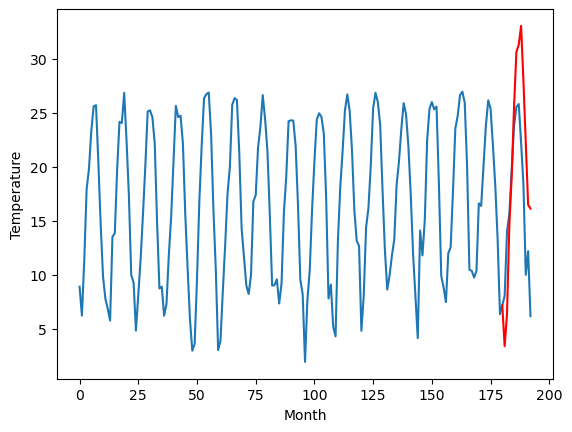

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.38		2.20		-3.18
3.81		5.17		1.36
11.72		13.40		1.68
13.51		17.87		4.36
17.48		24.36		6.88
20.76		29.44		8.68
21.39		30.10		8.71
21.44		31.85		10.41
18.93		26.74		7.81
16.62		21.01		4.39
8.53		15.29		6.76
11.30		14.93		3.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.46, 2.201240339279175, 5.169982948303223, 13.39541534423828, 17.87132791519165, 24.357035675048827, 29.442181148529052, 30.10325501203537, 31.84965656042099, 26.739085175991057, 21.013042905330657, 15.286335446834563, 14.933997758626937]


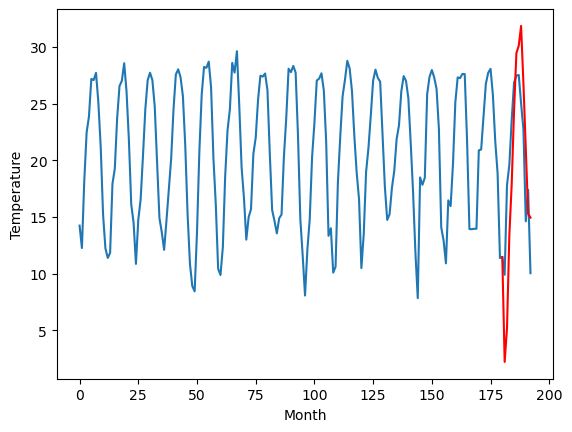

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.33		9.12		-2.21
8.24		12.09		3.85
18.14		20.32		2.18
20.07		24.79		4.72
23.93		31.28		7.35
29.13		36.36		7.23
29.56		37.02		7.46
30.32		38.77		8.45
28.31		33.66		5.35
23.96		27.93		3.97
16.39		22.21		5.82
18.72		21.85		3.13
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.27, 9.121240339279176, 12.089982948303224, 20.315415344238282, 24.79132791519165, 31.27703567504883, 36.362181148529054, 37.02325501203537, 38.76965656042099, 33.65908517599106, 27.93304290533066, 22.206335446834565, 21.85399775862694]


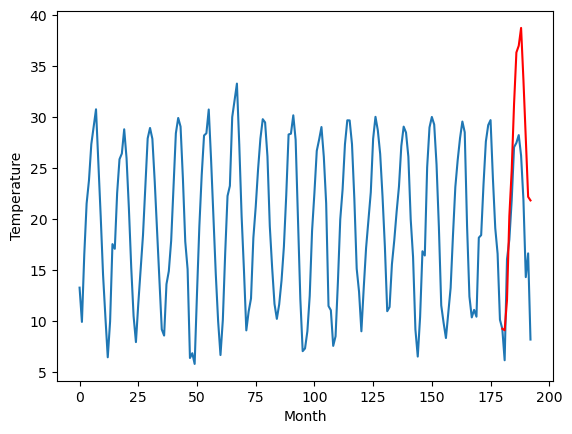

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.74		11.43		-1.31
13.39		14.40		1.01
18.29		22.63		4.34
21.66		27.10		5.44
25.17		33.59		8.42
29.74		38.67		8.93
31.73		39.33		7.60
32.21		41.08		8.87
29.20		35.97		6.77
25.60		30.24		4.64
17.43		24.52		7.09
18.48		24.16		5.68
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.77, 11.431240339279174, 14.399982948303222, 22.62541534423828, 27.10132791519165, 33.587035675048824, 38.67218114852905, 39.333255012035366, 41.079656560420986, 35.969085175991054, 30.243042905330654, 24.51633544683456, 24.163997758626934]


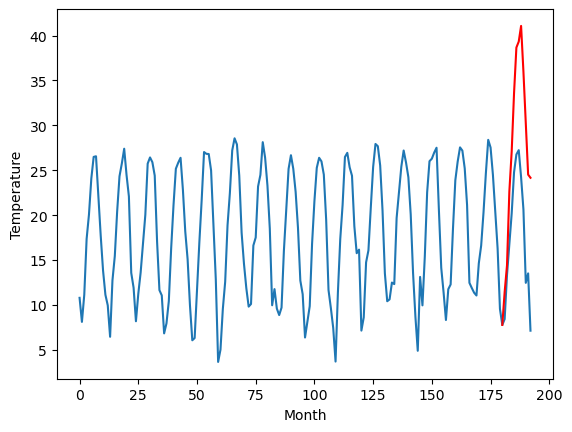

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.33		5.82		-2.51
8.97		8.79		-0.18
15.95		17.02		1.07
16.98		21.49		4.51
20.69		27.98		7.29
25.02		33.06		8.04
26.64		33.72		7.08
26.58		35.47		8.89
22.53		30.36		7.83
19.30		24.63		5.33
10.65		18.91		8.26
12.59		18.55		5.96
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 5.821240339279175, 8.789982948303223, 17.01541534423828, 21.49132791519165, 27.97703567504883, 33.06218114852905, 33.72325501203537, 35.46965656042099, 30.359085175991055, 24.633042905330655, 18.90633544683456, 18.553997758626934]


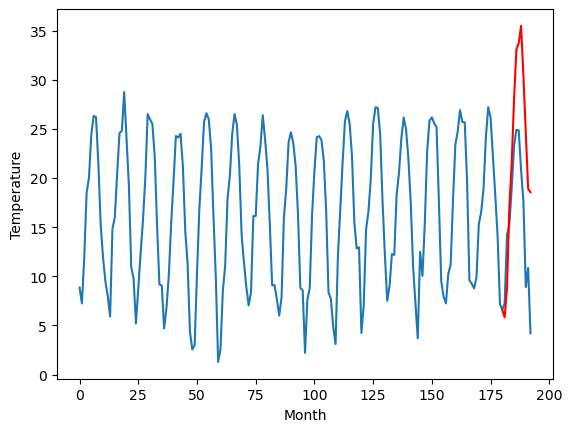

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.29		11.14		-2.15
13.91		14.11		0.20
20.43		22.34		1.91
24.06		26.81		2.75
27.08		33.30		6.22
31.87		38.38		6.51
33.99		39.04		5.05
33.94		40.79		6.85
29.43		35.68		6.25
25.58		29.95		4.37
16.08		24.23		8.15
18.14		23.87		5.73
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.3, 11.141240339279175, 14.109982948303223, 22.33541534423828, 26.81132791519165, 33.29703567504883, 38.38218114852906, 39.043255012035374, 40.789656560420994, 35.67908517599106, 29.953042905330662, 24.226335446834568, 23.873997758626942]


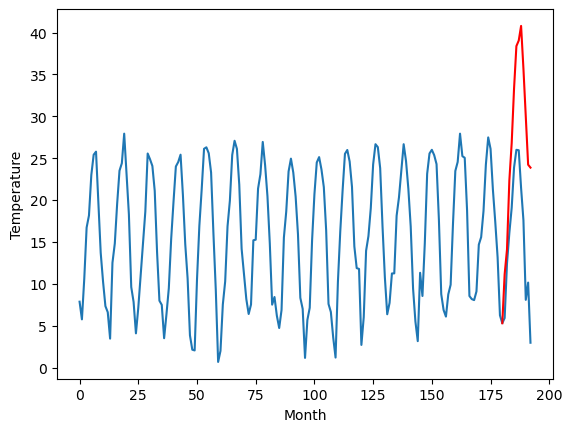

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.51		10.21		-2.30
8.24		13.18		4.94
20.71		21.41		0.70
23.31		25.88		2.57
28.00		32.37		4.37
34.19		37.45		3.26
34.76		38.11		3.35
34.70		39.86		5.16
30.96		34.75		3.79
27.00		29.02		2.02
16.96		23.30		6.34
18.76		22.94		4.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.1, 10.211240339279176, 13.179982948303223, 21.405415344238282, 25.88132791519165, 32.367035675048825, 37.45218114852905, 38.11325501203537, 39.85965656042099, 34.749085175991056, 29.023042905330655, 23.29633544683456, 22.943997758626935]


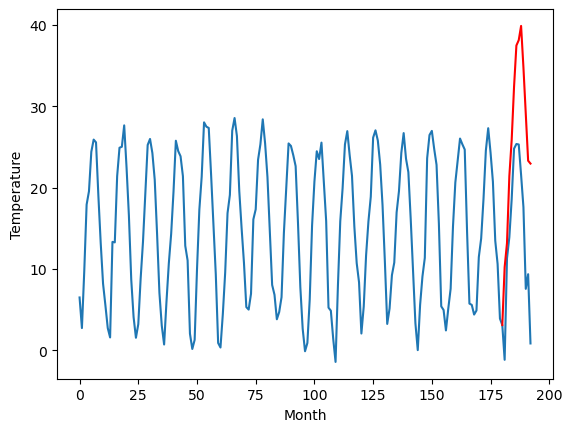

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.20		7.70		-1.50
7.03		10.67		3.64
17.78		18.90		1.12
20.84		23.37		2.53
25.31		29.86		4.55
31.79		34.94		3.15
32.80		35.60		2.80
33.40		37.35		3.95
29.54		32.24		2.70
25.07		26.51		1.44
14.41		20.79		6.38
15.64		20.43		4.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.6, 7.701240339279174, 10.669982948303222, 18.89541534423828, 23.37132791519165, 29.857035675048827, 34.94218114852905, 35.60325501203537, 37.34965656042099, 32.23908517599106, 26.513042905330657, 20.786335446834563, 20.433997758626937]


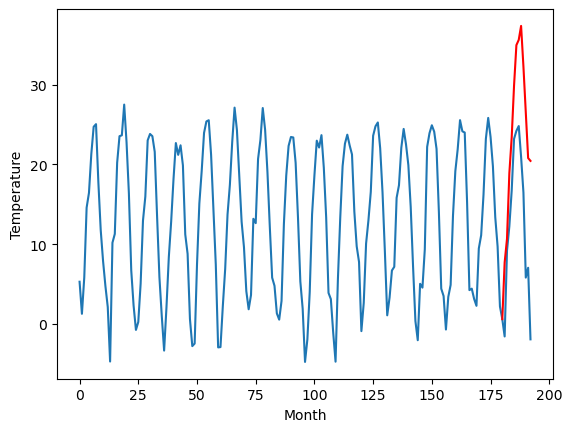

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.24		5.76		-1.48
2.93		8.73		5.80
14.66		16.96		2.30
18.63		21.43		2.80
23.78		27.92		4.14
31.09		33.00		1.91
31.68		33.66		1.98
32.39		35.41		3.02
28.34		30.30		1.96
23.99		24.57		0.58
13.13		18.85		5.72
12.23		18.49		6.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.75, 5.7612403392791744, 8.729982948303222, 16.955415344238283, 21.431327915191652, 27.91703567504883, 33.002181148529054, 33.66325501203537, 35.40965656042099, 30.29908517599106, 24.57304290533066, 18.846335446834566, 18.49399775862694]


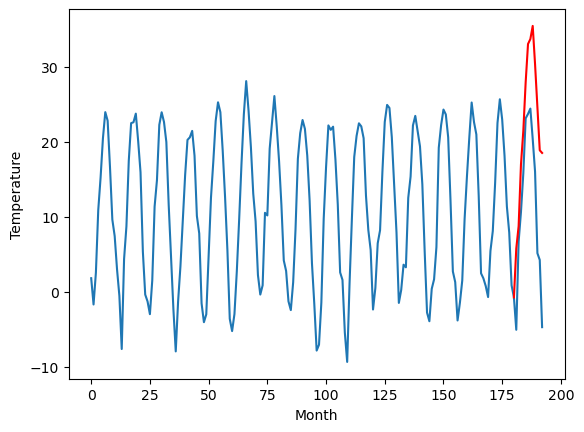

RangeIndex(start=1, stop=12, step=1)
[7.989999999999999, 8.53, 7.310000000000001, 5.3800000000000034, 11.33, 12.739999999999998, 8.33, 13.29, 12.51, 9.2, 7.24]
[5.7612403392791744, 4.781240339279175, 3.401240339279175, 2.201240339279175, 9.121240339279176, 11.431240339279174, 5.821240339279175, 11.141240339279175, 10.211240339279176, 7.701240339279174, 5.7612403392791744]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.99    5.76124
1                 1    8.53    4.78124
2                 2    7.31    3.40124
3                 3    5.38    2.20124
4                 4   11.33    9.12124
5                 5   12.74   11.43124
6                 6    8.33    5.82124
7                 7   13.29   11.14124
8                 8   12.51   10.21124
9                 9    9.20    7.70124
10               10    7.24    5.76124


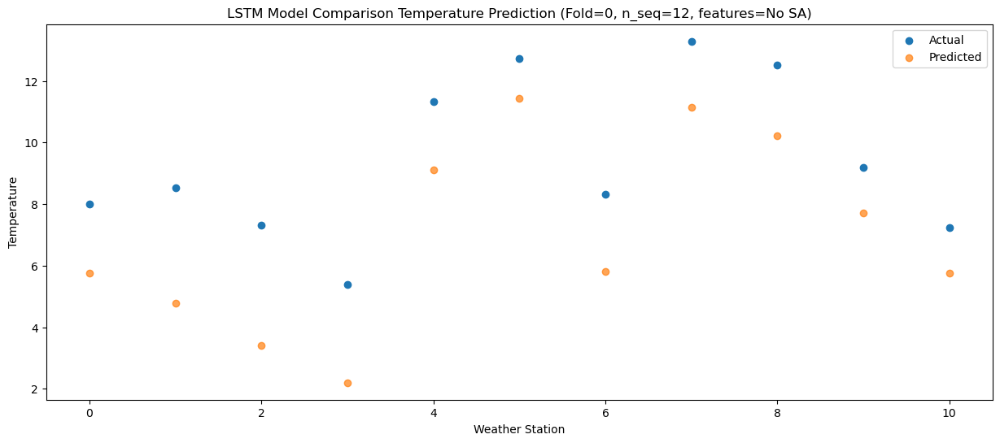

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.64   8.729983
1                 1    8.44   7.749983
2                 2    8.17   6.369983
3                 3    3.81   5.169983
4                 4    8.24  12.089983
5                 5   13.39  14.399983
6                 6    8.97   8.789983
7                 7   13.91  14.109983
8                 8    8.24  13.179983
9                 9    7.03  10.669983
10               10    2.93   8.729983


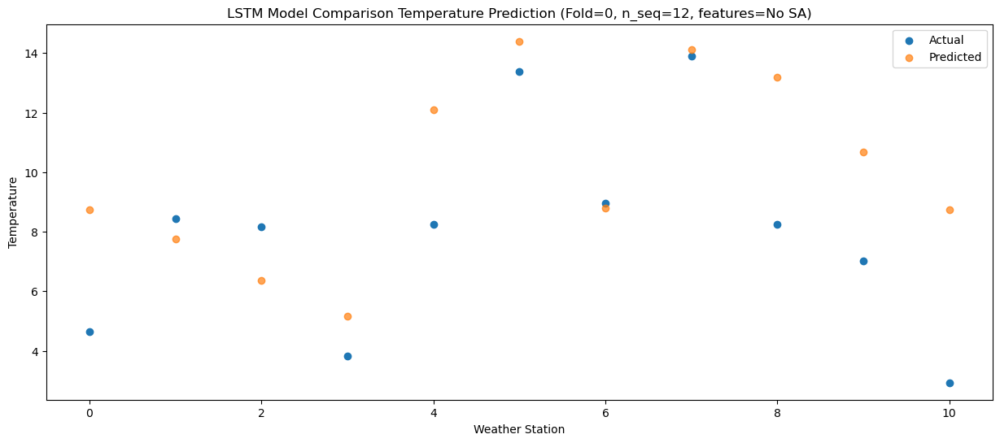

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.71  16.955415
1                 1   13.50  15.975415
2                 2   14.15  14.595415
3                 3   11.72  13.395415
4                 4   18.14  20.315415
5                 5   18.29  22.625415
6                 6   15.95  17.015415
7                 7   20.43  22.335415
8                 8   20.71  21.405415
9                 9   17.78  18.895415
10               10   14.66  16.955415


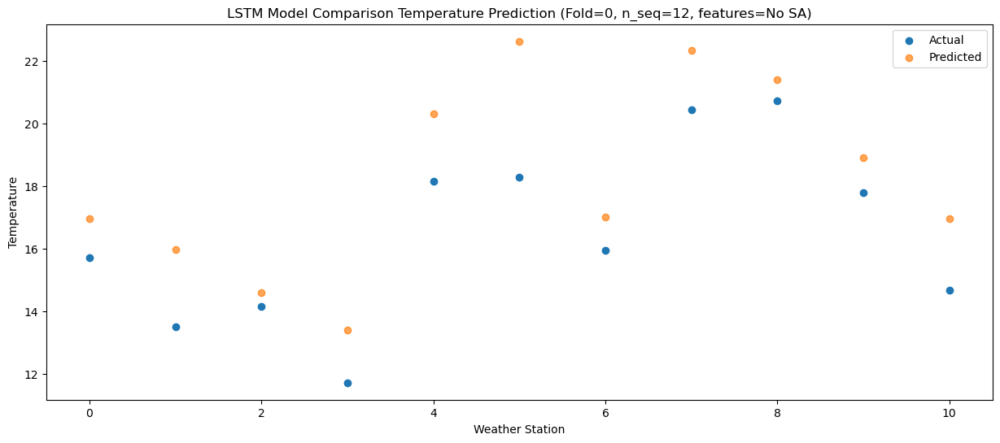

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.24  21.431328
1                 1   14.90  20.451328
2                 2   15.79  19.071328
3                 3   13.51  17.871328
4                 4   20.07  24.791328
5                 5   21.66  27.101328
6                 6   16.98  21.491328
7                 7   24.06  26.811328
8                 8   23.31  25.881328
9                 9   20.84  23.371328
10               10   18.63  21.431328


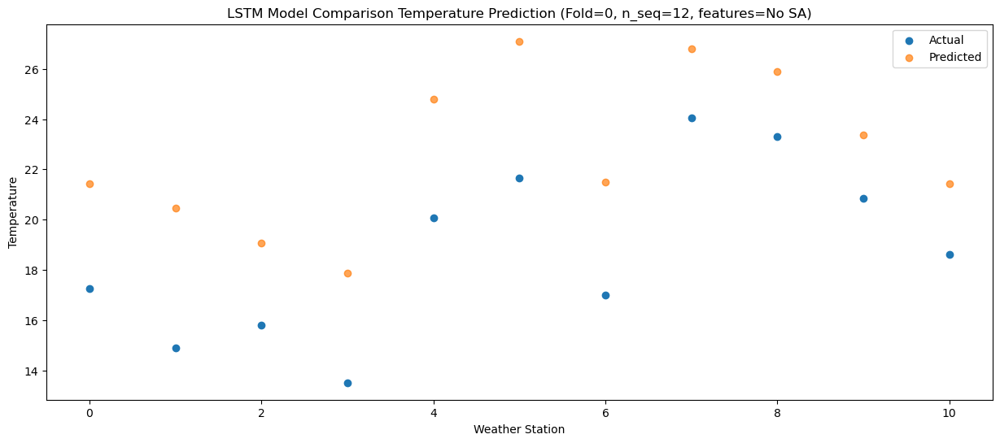

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   21.74  27.917036
1                 1   18.92  26.937036
2                 2   19.77  25.557036
3                 3   17.48  24.357036
4                 4   23.93  31.277036
5                 5   25.17  33.587036
6                 6   20.69  27.977036
7                 7   27.08  33.297036
8                 8   28.00  32.367036
9                 9   25.31  29.857036
10               10   23.78  27.917036


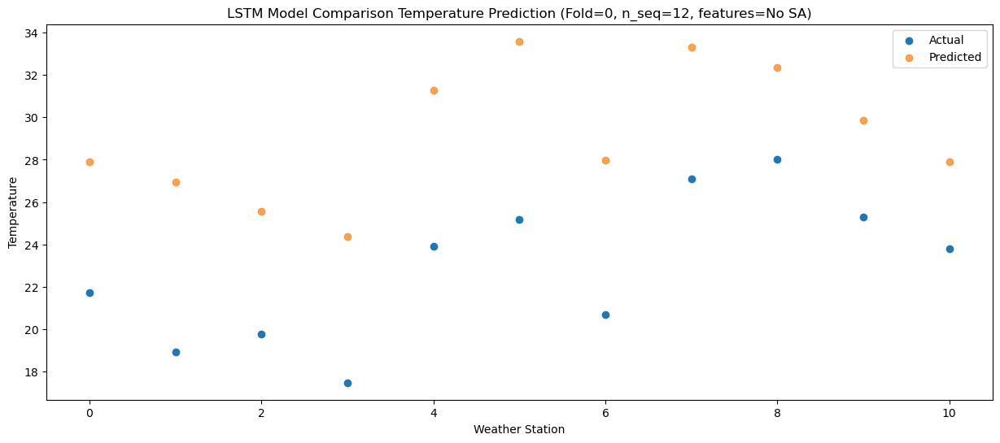

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   26.41  33.002181
1                 1   22.40  32.022181
2                 2   23.91  30.642181
3                 3   20.76  29.442181
4                 4   29.13  36.362181
5                 5   29.74  38.672181
6                 6   25.02  33.062181
7                 7   31.87  38.382181
8                 8   34.19  37.452181
9                 9   31.79  34.942181
10               10   31.09  33.002181


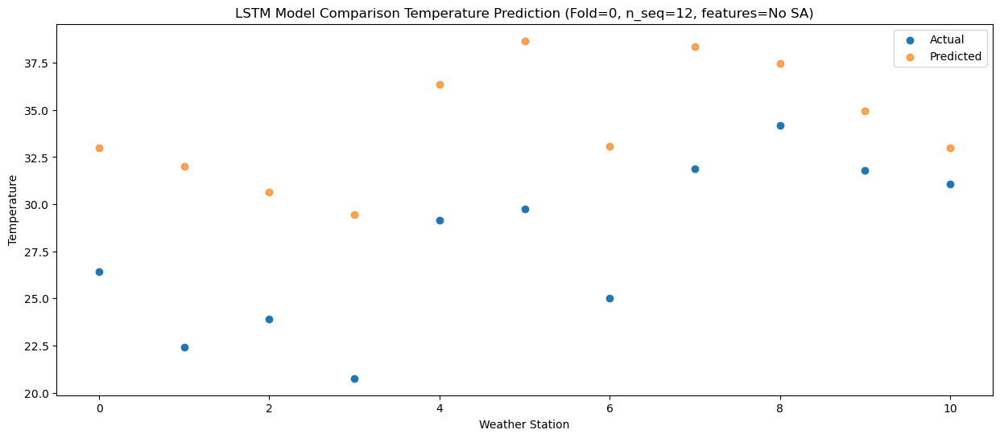

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   28.00  33.663255
1                 1   23.62  32.683255
2                 2   25.67  31.303255
3                 3   21.39  30.103255
4                 4   29.56  37.023255
5                 5   31.73  39.333255
6                 6   26.64  33.723255
7                 7   33.99  39.043255
8                 8   34.76  38.113255
9                 9   32.80  35.603255
10               10   31.68  33.663255


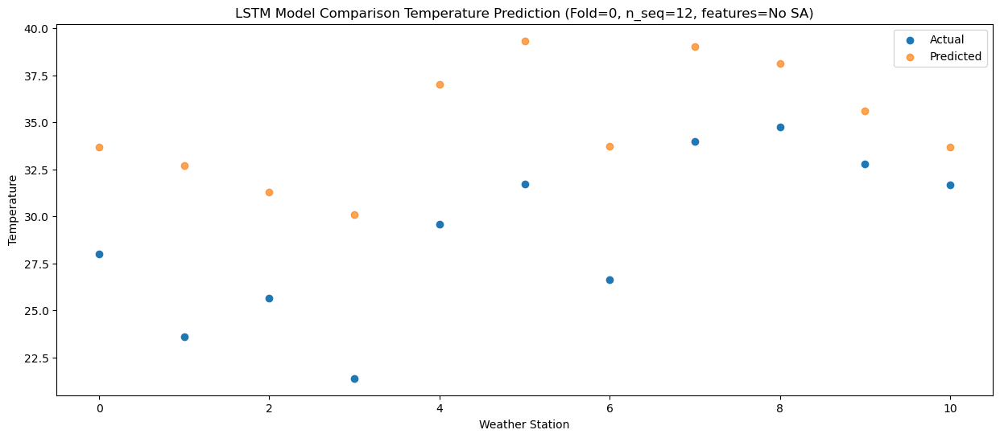

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   28.11  35.409657
1                 1   23.96  34.429657
2                 2   25.95  33.049657
3                 3   21.44  31.849657
4                 4   30.32  38.769657
5                 5   32.21  41.079657
6                 6   26.58  35.469657
7                 7   33.94  40.789657
8                 8   34.70  39.859657
9                 9   33.40  37.349657
10               10   32.39  35.409657
84/84 [==============================] - 5s 64ms/step - loss: 0.0853 - accuracy: 0.5714 - mae: 0.0659 - rmse: 0.0853 - mape: 14.8715 - pearson: 0.7526 - val_loss: 0.1722 - val_accuracy: 0.0000e+00 - val_mae: 0.1378 - val_rmse: 0.1722 - val_mape: 29.4951 - val_pearson: nan
Epoch 11/100
84/84 [==============================] - 5s 64ms/step - loss: 0.0838 - accuracy: 0.5714 - mae: 0.0658 - rmse: 0.0838 - mape: 14.5587 - pearson: 0.7424 - val_loss: 0.1483 - val_accuracy: 0.0000e+00 - val_mae: 0.1242 - val_rm

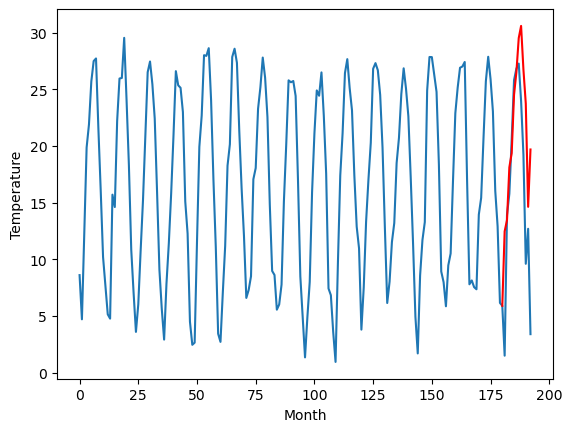

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.69		7.10		0.41
2.65		8.09		5.44
12.84		12.75		-0.09
16.60		14.00		-2.60
21.78		19.16		-2.62
29.03		21.15		-7.88
29.72		24.16		-5.56
30.48		25.23		-5.25
28.24		21.36		-6.88
19.98		18.37		-1.61
13.27		9.27		-4.00
10.88		14.33		3.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.63, 7.102482516765594, 8.093815703392028, 12.749864478111267, 14.004878063201904, 19.161005516052246, 21.14926995754242, 24.161588807106018, 25.231794018745422, 21.363398451805114, 18.37390269756317, 9.267516512870788, 14.327120203971862]


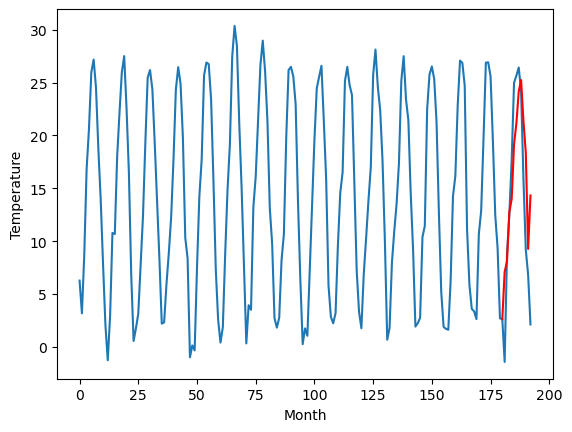

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.70		12.37		-0.33
15.43		13.36		-2.07
17.24		18.02		0.78
19.05		19.27		0.22
22.63		24.43		1.80
23.85		26.42		2.57
24.64		29.43		4.79
24.69		30.50		5.81
23.41		26.63		3.22
22.27		23.64		1.37
15.42		14.54		-0.88
16.32		19.60		3.28
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[16.55, 12.372482516765594, 13.363815703392028, 18.019864478111266, 19.274878063201903, 24.431005516052245, 26.41926995754242, 29.431588807106017, 30.50179401874542, 26.633398451805114, 23.64390269756317, 14.537516512870788, 19.597120203971862]


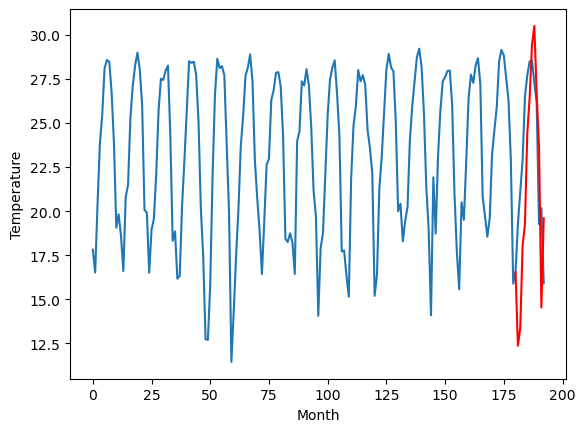

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.49		8.90		3.41
5.51		9.89		4.38
9.62		14.55		4.93
14.12		15.80		1.68
19.38		20.96		1.58
24.95		22.95		-2.00
26.95		25.96		-0.99
28.01		27.03		-0.98
24.84		23.16		-1.68
21.01		20.17		-0.84
12.93		11.07		-1.86
11.01		16.13		5.12
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.83, 8.902482516765595, 9.893815703392029, 14.549864478111267, 15.804878063201905, 20.961005516052246, 22.94926995754242, 25.96158880710602, 27.031794018745423, 23.163398451805115, 20.17390269756317, 11.067516512870789, 16.127120203971863]


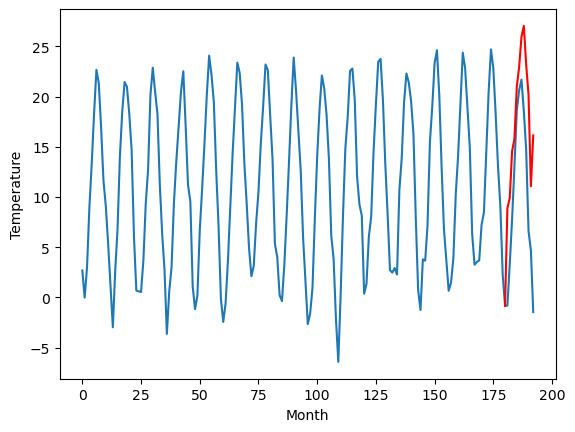

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.96		8.94		-0.02
8.22		9.93		1.71
15.55		14.59		-0.96
16.42		15.84		-0.58
20.89		21.00		0.11
24.37		22.99		-1.38
24.96		26.00		1.04
25.13		27.07		1.94
22.59		23.20		0.61
19.85		20.21		0.36
11.58		11.11		-0.47
14.99		16.17		1.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.52, 8.942482516765594, 9.933815703392028, 14.589864478111267, 15.844878063201904, 21.001005516052246, 22.98926995754242, 26.001588807106017, 27.071794018745422, 23.203398451805114, 20.21390269756317, 11.107516512870788, 16.167120203971862]


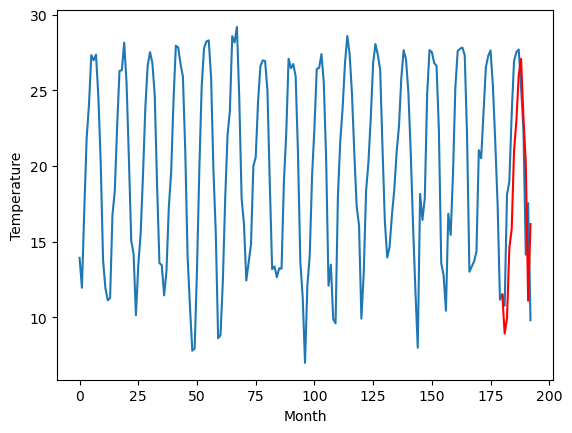

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.69		6.61		0.92
3.34		7.60		4.26
11.72		12.26		0.54
13.84		13.51		-0.33
17.88		18.67		0.79
22.43		20.66		-1.77
22.51		23.67		1.16
23.62		24.74		1.12
20.88		20.87		-0.01
17.58		17.88		0.30
9.94		8.78		-1.16
13.18		13.84		0.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.47, 6.612482516765595, 7.603815703392029, 12.259864478111268, 13.514878063201905, 18.671005516052247, 20.65926995754242, 23.67158880710602, 24.741794018745424, 20.873398451805116, 17.883902697563173, 8.77751651287079, 13.837120203971864]


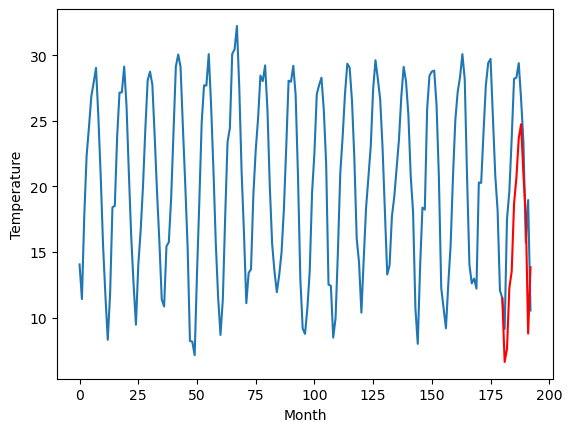

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
17.12		18.15		1.03
14.01		19.14		5.13
24.38		23.80		-0.58
26.08		25.05		-1.03
30.16		30.21		0.05
35.72		32.20		-3.52
36.61		35.21		-1.40
37.17		36.28		-0.89
34.90		32.41		-2.49
30.39		29.42		-0.97
22.42		20.32		-2.10
24.71		25.38		0.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 18.152482516765595, 19.14381570339203, 23.799864478111267, 25.054878063201905, 30.211005516052246, 32.19926995754242, 35.21158880710602, 36.28179401874542, 32.413398451805115, 29.42390269756317, 20.31751651287079, 25.377120203971863]


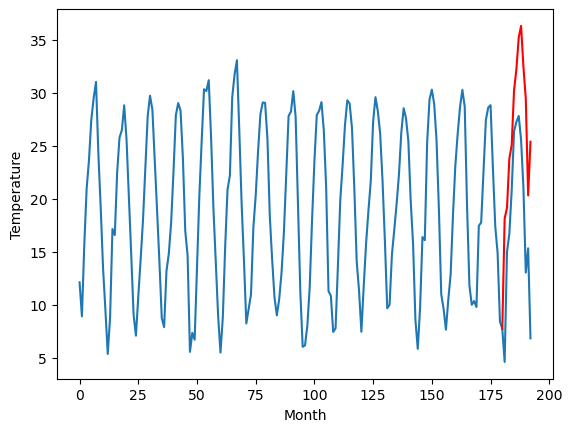

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.22		3.01		-0.21
6.14		4.00		-2.14
9.24		8.66		-0.58
15.90		9.91		-5.99
20.91		15.07		-5.84
25.90		17.06		-8.84
24.70		20.07		-4.63
24.18		21.14		-3.04
22.00		17.27		-4.73
15.44		14.28		-1.16
10.04		5.18		-4.86
6.69		10.24		3.55
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.9, 3.0124825167655946, 4.0038157033920285, 8.659864478111267, 9.914878063201904, 15.071005516052246, 17.05926995754242, 20.071588807106018, 21.141794018745422, 17.273398451805114, 14.283902697563171, 5.177516512870788, 10.237120203971863]


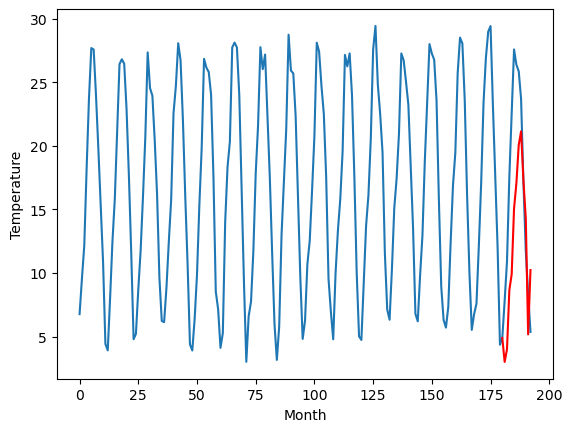

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.88		14.27		0.39
12.96		15.26		2.30
12.56		19.92		7.36
16.42		21.17		4.75
18.64		26.33		7.69
22.88		28.32		5.44
25.86		31.33		5.47
25.46		32.40		6.94
23.68		28.53		4.85
18.70		25.54		6.84
17.44		16.44		-1.00
10.93		21.50		10.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.14, 14.272482516765594, 15.263815703392028, 19.919864478111265, 21.174878063201902, 26.331005516052244, 28.319269957542417, 31.331588807106016, 32.40179401874542, 28.533398451805112, 25.54390269756317, 16.437516512870786, 21.49712020397186]


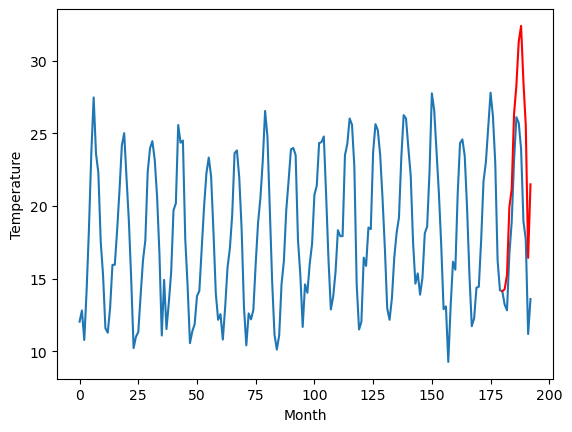

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.64		14.38		0.74
14.14		15.37		1.23
21.02		20.03		-0.99
23.81		21.28		-2.53
27.83		26.44		-1.39
32.12		28.43		-3.69
33.69		31.44		-2.25
33.78		32.51		-1.27
29.67		28.64		-1.03
26.39		25.65		-0.74
17.48		16.55		-0.93
19.40		21.61		2.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.55, 14.382482516765595, 15.37381570339203, 20.029864478111268, 21.284878063201905, 26.441005516052247, 28.42926995754242, 31.44158880710602, 32.51179401874542, 28.643398451805112, 25.65390269756317, 16.547516512870786, 21.60712020397186]


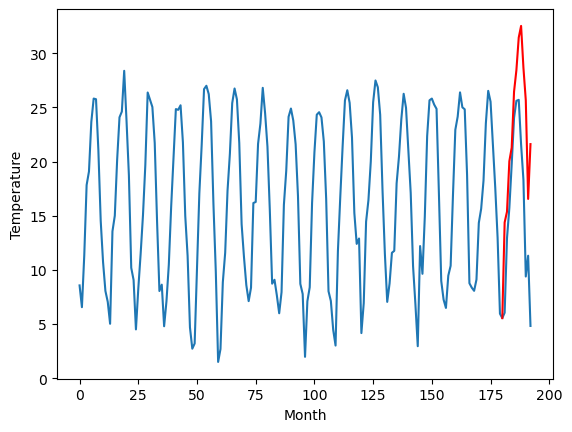

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.47		12.47		0.00
13.82		13.46		-0.36
20.03		18.12		-1.91
22.00		19.37		-2.63
26.91		24.53		-2.38
32.32		26.52		-5.80
33.63		29.53		-4.10
33.71		30.60		-3.11
29.22		26.73		-2.49
25.46		23.74		-1.72
15.24		14.64		-0.60
17.34		19.70		2.36
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.19, 12.472482516765595, 13.46381570339203, 18.119864478111268, 19.374878063201905, 24.531005516052247, 26.51926995754242, 29.53158880710602, 30.601794018745423, 26.733398451805115, 23.743902697563172, 14.63751651287079, 19.697120203971863]


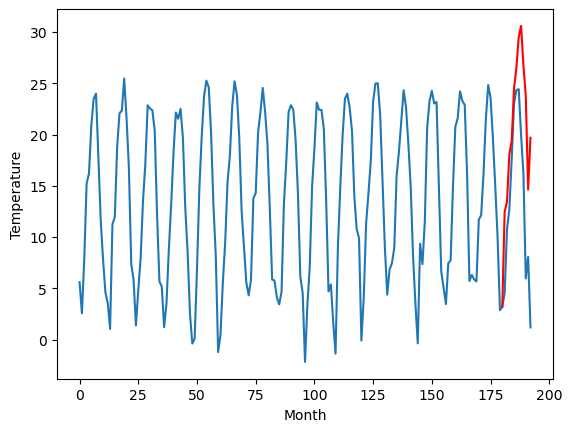

RangeIndex(start=1, stop=12, step=1)
[11.88, 6.69, 12.7, 5.490000000000001, 8.96, 5.69, 17.12, 3.2200000000000015, 13.880000000000003, 13.64, 12.47]
[12.472482516765595, 7.102482516765594, 12.372482516765594, 8.902482516765595, 8.942482516765594, 6.612482516765595, 18.152482516765595, 3.0124825167655946, 14.272482516765594, 14.382482516765595, 12.472482516765595]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   11.88  12.472483
1                 1    6.69   7.102483
2                 2   12.70  12.372483
3                 3    5.49   8.902483
4                 4    8.96   8.942483
5                 5    5.69   6.612483
6                 6   17.12  18.152483
7                 7    3.22   3.012483
8                 8   13.88  14.272483
9                 9   13.64  14.382483
10               10   12.47  12.472483


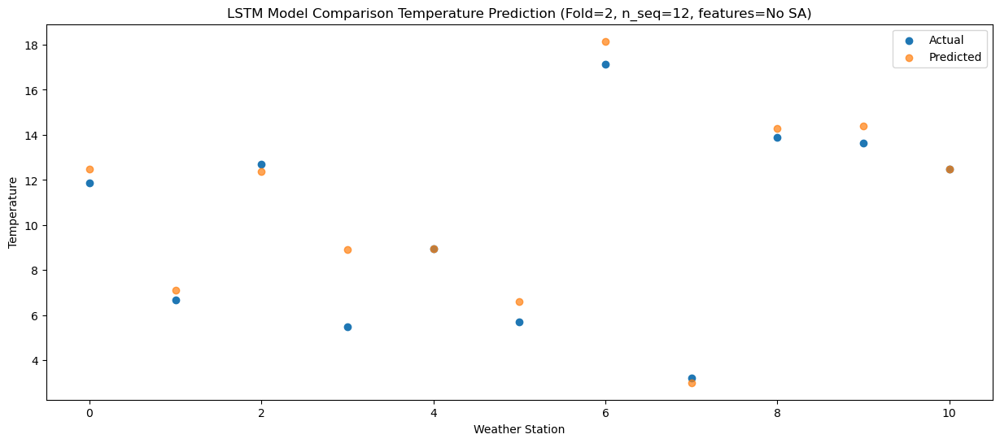

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    7.48  13.463816
1                 1    2.65   8.093816
2                 2   15.43  13.363816
3                 3    5.51   9.893816
4                 4    8.22   9.933816
5                 5    3.34   7.603816
6                 6   14.01  19.143816
7                 7    6.14   4.003816
8                 8   12.96  15.263816
9                 9   14.14  15.373816
10               10   13.82  13.463816


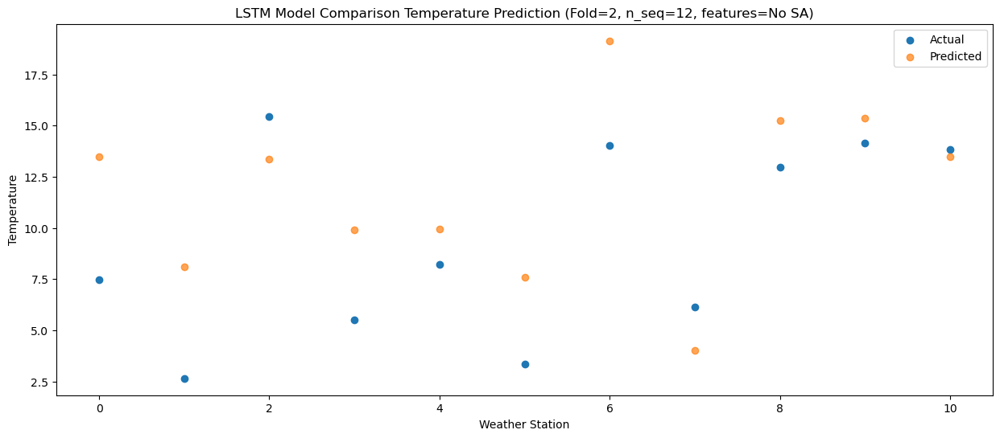

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   19.90  18.119864
1                 1   12.84  12.749864
2                 2   17.24  18.019864
3                 3    9.62  14.549864
4                 4   15.55  14.589864
5                 5   11.72  12.259864
6                 6   24.38  23.799864
7                 7    9.24   8.659864
8                 8   12.56  19.919864
9                 9   21.02  20.029864
10               10   20.03  18.119864


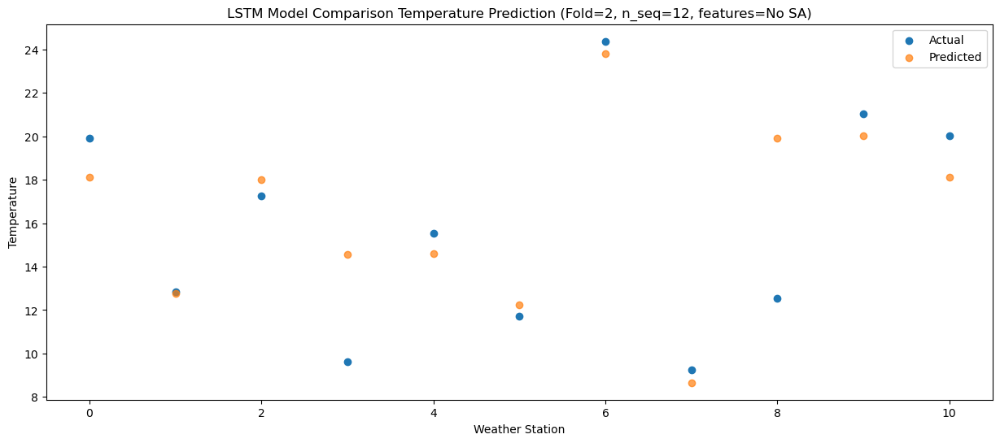

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   21.77  19.374878
1                 1   16.60  14.004878
2                 2   19.05  19.274878
3                 3   14.12  15.804878
4                 4   16.42  15.844878
5                 5   13.84  13.514878
6                 6   26.08  25.054878
7                 7   15.90   9.914878
8                 8   16.42  21.174878
9                 9   23.81  21.284878
10               10   22.00  19.374878


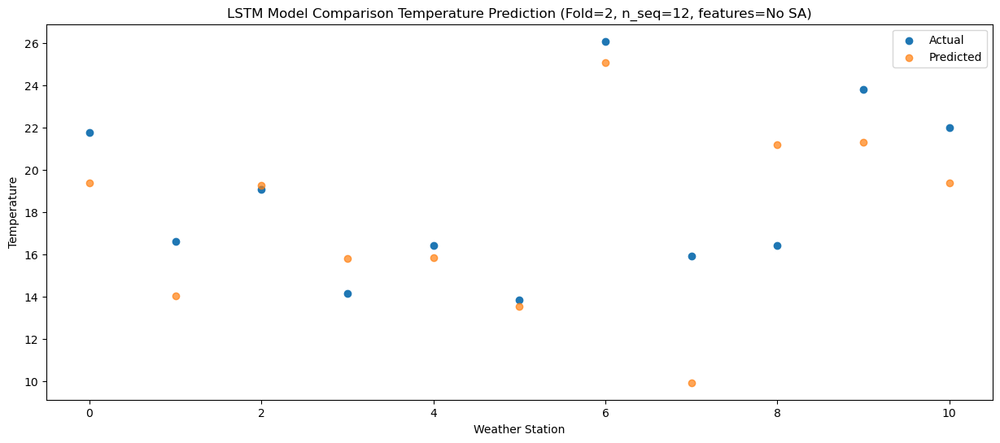

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   26.55  24.531006
1                 1   21.78  19.161006
2                 2   22.63  24.431006
3                 3   19.38  20.961006
4                 4   20.89  21.001006
5                 5   17.88  18.671006
6                 6   30.16  30.211006
7                 7   20.91  15.071006
8                 8   18.64  26.331006
9                 9   27.83  26.441006
10               10   26.91  24.531006


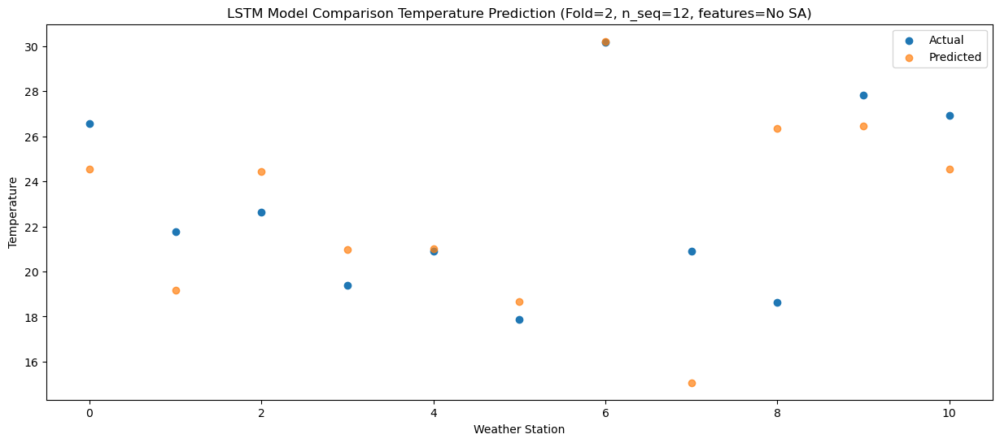

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   31.80   26.51927
1                 1   29.03   21.14927
2                 2   23.85   26.41927
3                 3   24.95   22.94927
4                 4   24.37   22.98927
5                 5   22.43   20.65927
6                 6   35.72   32.19927
7                 7   25.90   17.05927
8                 8   22.88   28.31927
9                 9   32.12   28.42927
10               10   32.32   26.51927


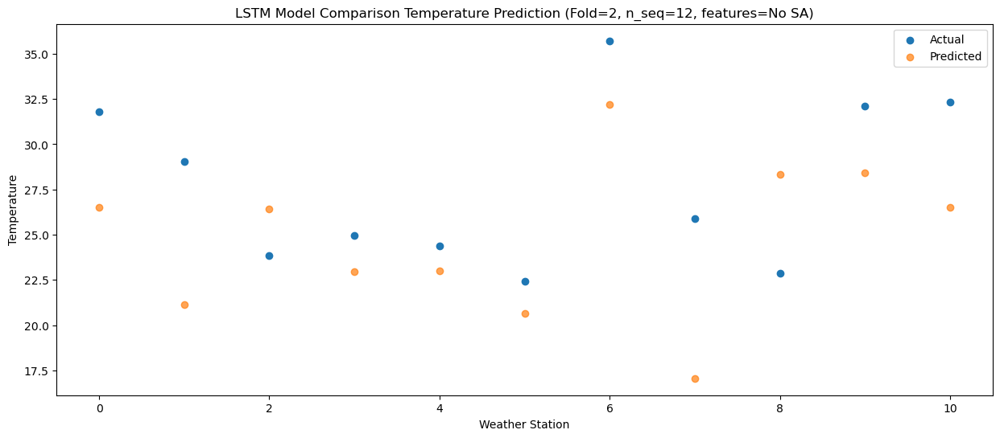

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   32.81  29.531589
1                 1   29.72  24.161589
2                 2   24.64  29.431589
3                 3   26.95  25.961589
4                 4   24.96  26.001589
5                 5   22.51  23.671589
6                 6   36.61  35.211589
7                 7   24.70  20.071589
8                 8   25.86  31.331589
9                 9   33.69  31.441589
10               10   33.63  29.531589


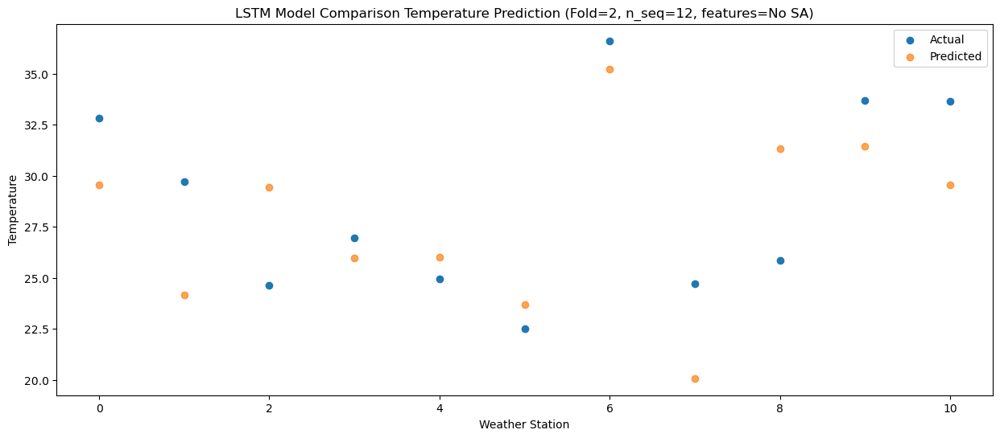

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   33.26  30.601794
1                 1   30.48  25.231794
2                 2   24.69  30.501794
3                 3   28.01  27.031794
4                 4   25.13  27.071794
5                 5   23.62  24.741794
6                 6   37.17  36.281794
7                 7   24.18  21.141794
8                 8   25.46  32.401794
9                 9   33.78  32.511794
10               10   33.71  30.601794


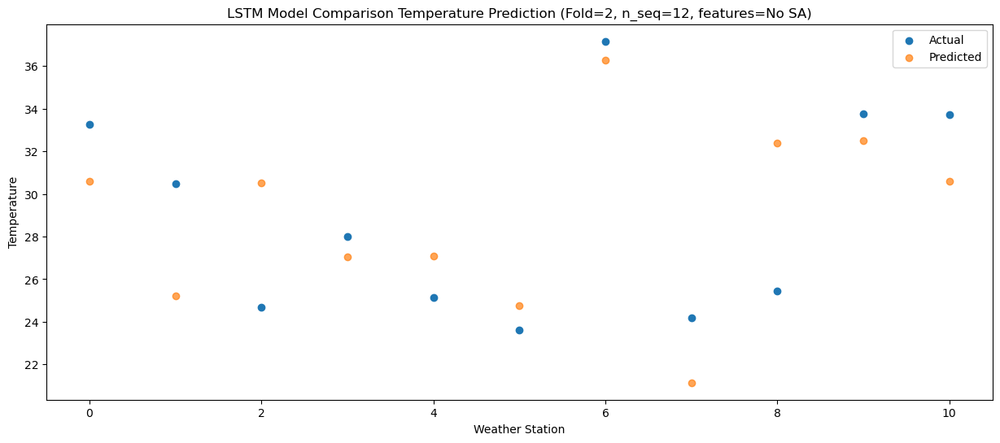

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   29.96  26.733398
1                 1   28.24  21.363398
2                 2   23.41  26.633398
3                 3   24.84  23.163398
4                 4   22.59  23.203398
5                 5   20.88  20.873398
6                 6   34.90  32.413398
7                 7   22.00  17.273398
8                 8   23.68  28.533398
9                 9   29.67  28.643398
10               10   29.22  26.733398


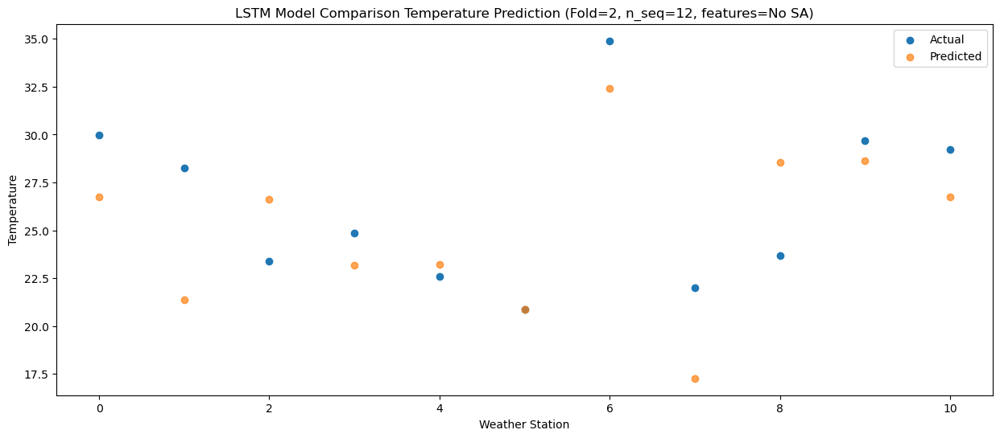

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   25.21  23.743903
1                 1   19.98  18.373903
2                 2   22.27  23.643903
3                 3   21.01  20.173903
4                 4   19.85  20.213903
5                 5   17.58  17.883903
6                 6   30.39  29.423903
7                 7   15.44  14.283903
8                 8   18.70  25.543903
9                 9   26.39  25.653903
10               10   25.46  23.743903


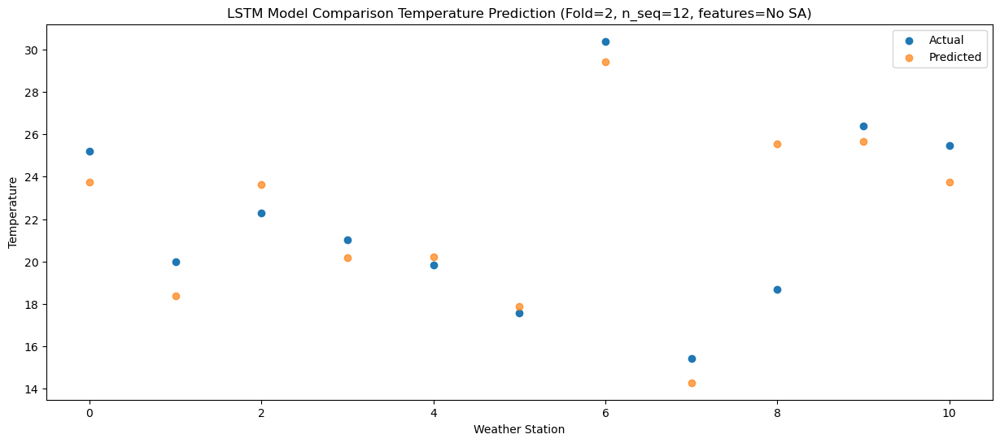

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   15.59  14.637517
1                 1   13.27   9.267517
2                 2   15.42  14.537517
3                 3   12.93  11.067517
4                 4   11.58  11.107517
5                 5    9.94   8.777517
6                 6   22.42  20.317517
7                 7   10.04   5.177517
8                 8   17.44  16.437517
9                 9   17.48  16.547517
10               10   15.24  14.637517


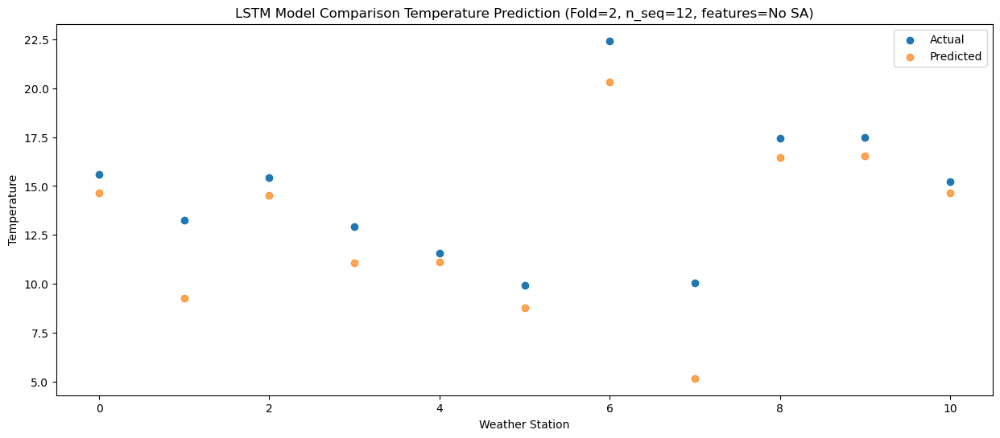

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   18.68   19.69712
1                 1   10.88   14.32712
2                 2   16.32   19.59712
3                 3   11.01   16.12712
4                 4   14.99   16.16712
5                 5   13.18   13.83712
6                 6   24.71   25.37712
7                 7    6.69   10.23712
8                 8   10.93   21.49712
9                 9   19.40   21.60712
10               10   17.34   19.69712


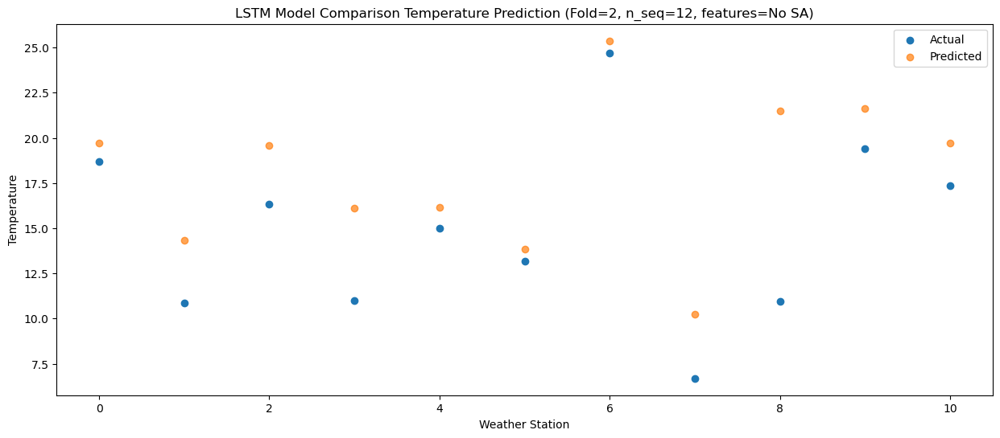

Model: "sequential_505"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1010 (LSTM)            (1, 1, 1024)              12996608  
                                                                 
 dropout_1010 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1011 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1011 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1515 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1516 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1517 (Dense)          (1, 12)                

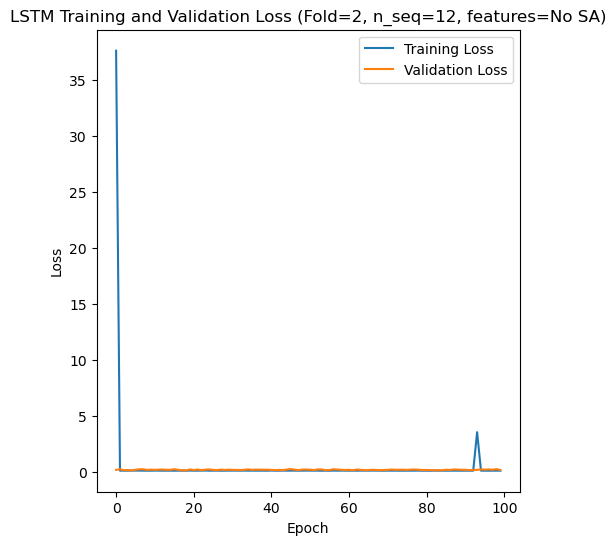

Epoch 1/100
84/84 [==============================] - 11s 75ms/step - loss: 31.2764 - accuracy: 0.4762 - mae: 30.9208 - rmse: 31.2764 - mape: 7484.5840 - pearson: 0.5535 - val_loss: 0.1358 - val_accuracy: 0.0000e+00 - val_mae: 0.1139 - val_rmse: 0.1358 - val_mape: 25.3213 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 5s 61ms/step - loss: 0.0777 - accuracy: 0.6667 - mae: 0.0610 - rmse: 0.0777 - mape: 14.3568 - pearson: 0.7826 - val_loss: 0.1700 - val_accuracy: 0.0000e+00 - val_mae: 0.1429 - val_rmse: 0.1700 - val_mape: 31.7051 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 5s 62ms/step - loss: 0.4218 - accuracy: 0.5833 - mae: 0.3920 - rmse: 0.4218 - mape: 85.1698 - pearson: 0.7334 - val_loss: 0.1389 - val_accuracy: 0.0000e+00 - val_mae: 0.1154 - val_rmse: 0.1389 - val_mape: 25.8143 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 5s 62ms/step - loss: 0.0848 - accuracy: 0.6190 - mae: 0.0659 - rmse: 0.0848 - mape: 15

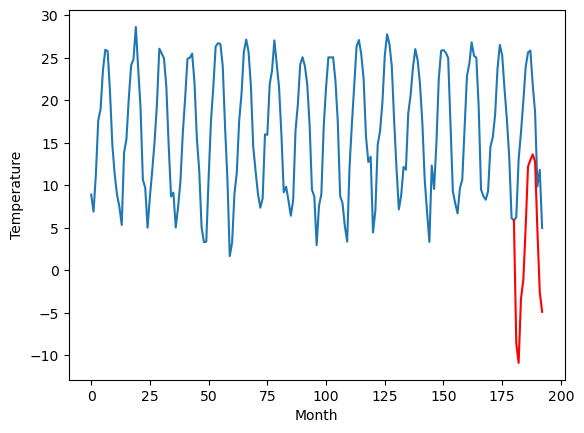

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.42		9.21		0.79
4.70		6.91		2.21
16.67		14.43		-2.24
18.53		16.67		-1.86
22.75		22.89		0.14
29.46		29.98		0.52
30.77		30.77		0.00
31.34		31.43		0.09
28.61		30.60		1.99
22.01		22.44		0.43
14.30		15.26		0.96
15.61		12.92		-2.69
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.2, 9.21431419968605, 6.90509436249733, 14.431354261636734, 16.67238900780678, 22.88639590859413, 29.97972676873207, 30.773986018896103, 31.426676250696183, 30.597913838624955, 22.44388399243355, 15.260223962068558, 12.916310168504715]


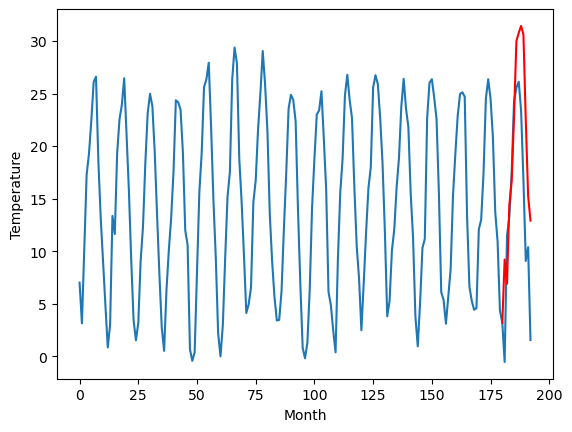

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.30		8.68		-1.62
12.60		6.38		-6.22
13.75		13.90		0.15
19.48		16.14		-3.34
24.28		22.36		-1.92
29.13		29.45		0.32
32.26		30.24		-2.02
30.06		30.90		0.84
26.75		30.07		3.32
18.09		21.91		3.82
13.75		14.73		0.98
9.83		12.39		2.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[8.48, 8.68431419968605, 6.375094362497329, 13.901354261636733, 16.142389007806777, 22.35639590859413, 29.44972676873207, 30.243986018896102, 30.89667625069618, 30.067913838624953, 21.913883992433547, 14.730223962068557, 12.386310168504714]


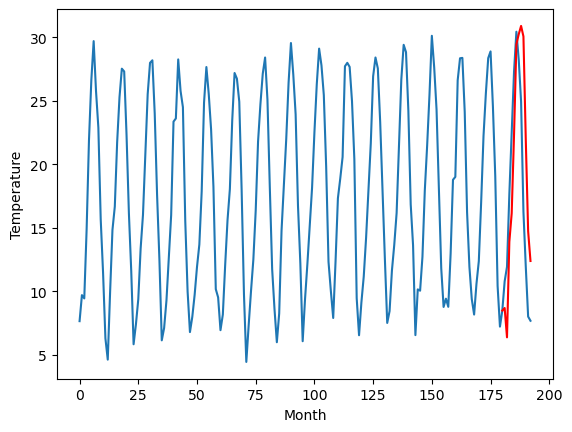

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.74		2.84		1.10
0.42		0.54		0.12
10.63		8.06		-2.57
12.98		10.30		-2.68
17.05		16.52		-0.53
22.97		23.61		0.64
23.96		24.40		0.44
24.48		25.06		0.58
20.35		24.23		3.88
16.77		16.07		-0.70
7.11		8.89		1.78
8.60		6.55		-2.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.55, 2.8443141996860506, 0.5350943624973299, 8.061354261636733, 10.302389007806777, 16.51639590859413, 23.60972676873207, 24.403986018896102, 25.05667625069618, 24.227913838624954, 16.073883992433547, 8.890223962068557, 6.546310168504714]


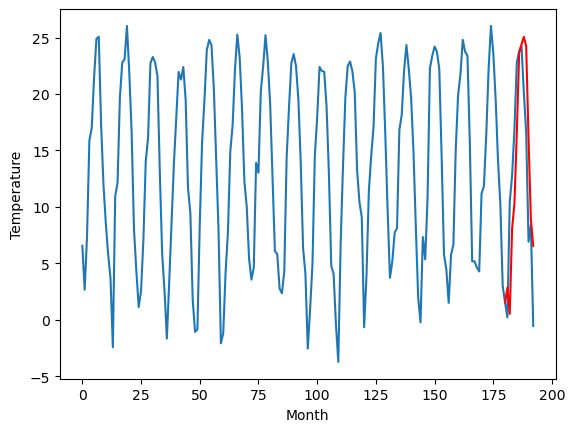

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.43		8.54		1.11
3.56		6.24		2.68
16.64		13.76		-2.88
19.93		16.00		-3.93
24.50		22.22		-2.28
31.98		29.31		-2.67
31.98		30.10		-1.88
32.10		30.76		-1.34
28.74		29.93		1.19
23.32		21.77		-1.55
13.58		14.59		1.01
13.22		12.25		-0.97
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.08, 8.54431419968605, 6.23509436249733, 13.761354261636734, 16.002389007806777, 22.21639590859413, 29.30972676873207, 30.1039860188961, 30.75667625069618, 29.927913838624953, 21.773883992433547, 14.590223962068556, 12.246310168504714]


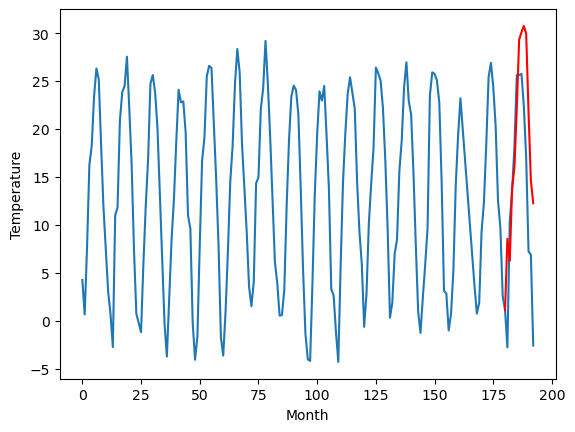

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.57		6.66		1.09
2.85		4.36		1.51
14.18		11.88		-2.30
17.63		14.12		-3.51
21.91		20.34		-1.57
28.62		27.43		-1.19
29.00		28.22		-0.78
29.32		28.88		-0.44
26.06		28.05		1.99
21.48		19.89		-1.59
10.63		12.71		2.08
11.68		10.37		-1.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.21, 6.66431419968605, 4.355094362497329, 11.881354261636734, 14.122389007806778, 20.33639590859413, 27.42972676873207, 28.223986018896102, 28.876676250696182, 28.047913838624954, 19.893883992433548, 12.710223962068557, 10.366310168504715]


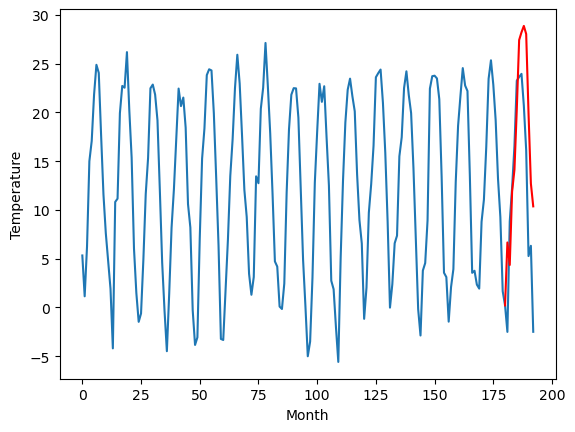

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.92		7.29		-0.63
8.02		4.99		-3.03
10.99		12.51		1.52
15.77		14.75		-1.02
20.82		20.97		0.15
28.21		28.06		-0.15
30.05		28.85		-1.20
28.13		29.51		1.38
26.26		28.68		2.42
18.29		20.52		2.23
15.55		13.34		-2.21
10.79		11.00		0.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-8.22, 7.294314199686051, 4.98509436249733, 12.511354261636734, 14.752389007806778, 20.96639590859413, 28.05972676873207, 28.8539860188961, 29.50667625069618, 28.677913838624953, 20.523883992433547, 13.340223962068556, 10.996310168504714]


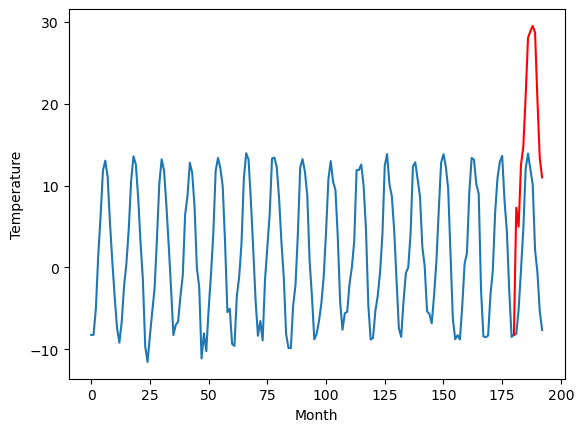

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.12		6.21		-0.91
9.97		3.91		-6.06
11.57		11.43		-0.14
19.54		13.67		-5.87
23.97		19.89		-4.08
31.61		26.98		-4.63
32.69		27.77		-4.92
31.46		28.43		-3.03
27.49		27.60		0.11
17.14		19.44		2.30
14.62		12.26		-2.36
7.35		9.92		2.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.04, 6.214314199686051, 3.90509436249733, 11.431354261636734, 13.672389007806778, 19.88639590859413, 26.97972676873207, 27.773986018896103, 28.426676250696183, 27.597913838624955, 19.44388399243355, 12.260223962068558, 9.916310168504715]


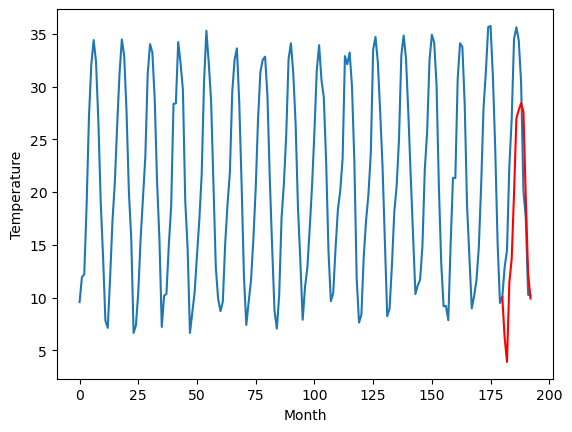

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.47		3.89		-1.58
6.40		1.59		-4.81
6.18		9.11		2.93
8.37		11.35		2.98
12.66		17.57		4.91
14.36		24.66		10.30
13.54		25.45		11.91
14.09		26.11		12.02
13.54		25.28		11.74
10.78		17.12		6.34
7.96		9.94		1.98
4.26		7.60		3.34
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.17, 3.8943141996860504, 1.5850943624973297, 9.111354261636734, 11.352389007806778, 17.56639590859413, 24.65972676873207, 25.453986018896103, 26.106676250696182, 25.277913838624954, 17.123883992433548, 9.940223962068558, 7.596310168504715]


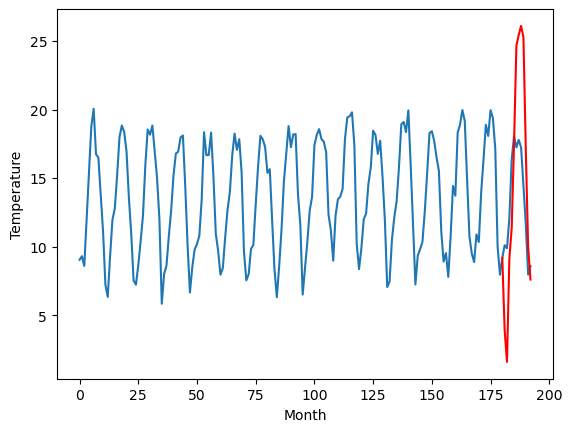

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.31		4.97		2.66
2.19		2.67		0.48
7.19		10.19		3.00
11.81		12.43		0.62
16.64		18.65		2.01
22.51		25.74		3.23
24.65		26.53		1.88
25.27		27.19		1.92
21.95		26.36		4.41
17.51		18.20		0.69
8.59		11.02		2.43
6.99		8.68		1.69
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.94, 4.9743141996860505, 2.66509436249733, 10.191354261636734, 12.432389007806778, 18.64639590859413, 25.73972676873207, 26.5339860188961, 27.18667625069618, 26.357913838624953, 18.203883992433546, 11.020223962068556, 8.676310168504713]


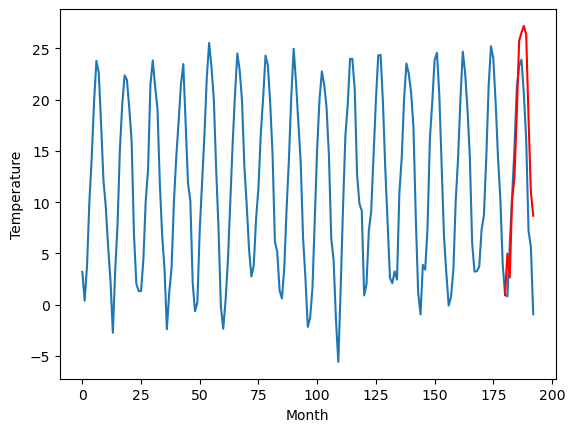

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-9.80		-8.60		1.20
-10.60		-10.90		-0.30
-3.41		-3.38		0.03
1.46		-1.14		-2.60
5.72		5.08		-0.64
11.89		12.17		0.28
13.53		12.96		-0.57
13.26		13.62		0.36
9.00		12.79		3.79
4.88		4.63		-0.25
-5.34		-2.55		2.79
-5.75		-4.89		0.86
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.13, -8.59568580031395, -10.90490563750267, -3.378645738363266, -1.1376109921932223, 5.076395908594131, 12.16972676873207, 12.963986018896103, 13.616676250696182, 12.787913838624954, 4.633883992433548, -2.5497760379314425, -4.893689831495285]


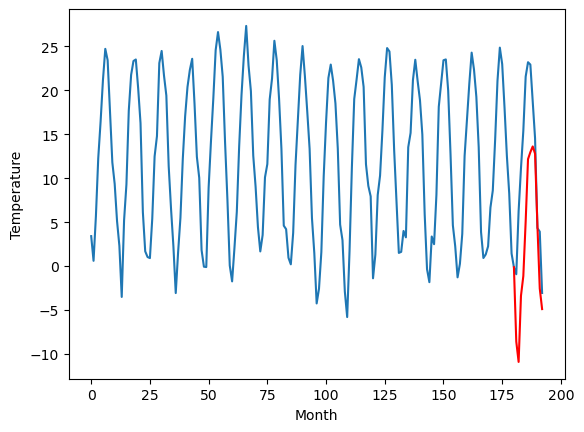

RangeIndex(start=1, stop=12, step=1)
[-8.520000000000001, 8.420000000000002, 10.299999999999999, 1.7399999999999998, 7.430000000000001, 5.5699999999999985, 7.92, 7.119999999999999, 5.4700000000000015, 2.3099999999999996, -9.8]
[-8.59568580031395, 9.21431419968605, 8.68431419968605, 2.8443141996860506, 8.54431419968605, 6.66431419968605, 7.294314199686051, 6.214314199686051, 3.8943141996860504, 4.9743141996860505, -8.59568580031395]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   -8.52  -8.595686
1                 1    8.42   9.214314
2                 2   10.30   8.684314
3                 3    1.74   2.844314
4                 4    7.43   8.544314
5                 5    5.57   6.664314
6                 6    7.92   7.294314
7                 7    7.12   6.214314
8                 8    5.47   3.894314
9                 9    2.31   4.974314
10               10   -9.80  -8.595686


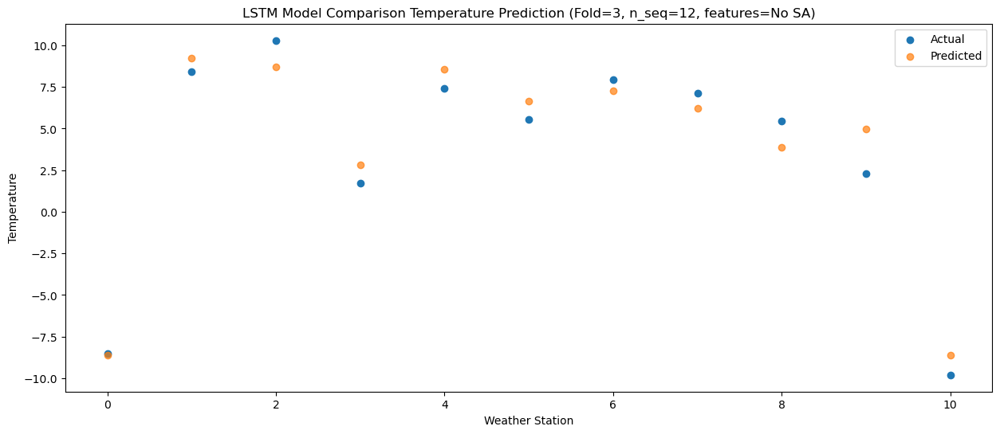

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -8.15 -10.904906
1                 1    4.70   6.905094
2                 2   12.60   6.375094
3                 3    0.42   0.535094
4                 4    3.56   6.235094
5                 5    2.85   4.355094
6                 6    8.02   4.985094
7                 7    9.97   3.905094
8                 8    6.40   1.585094
9                 9    2.19   2.665094
10               10  -10.60 -10.904906


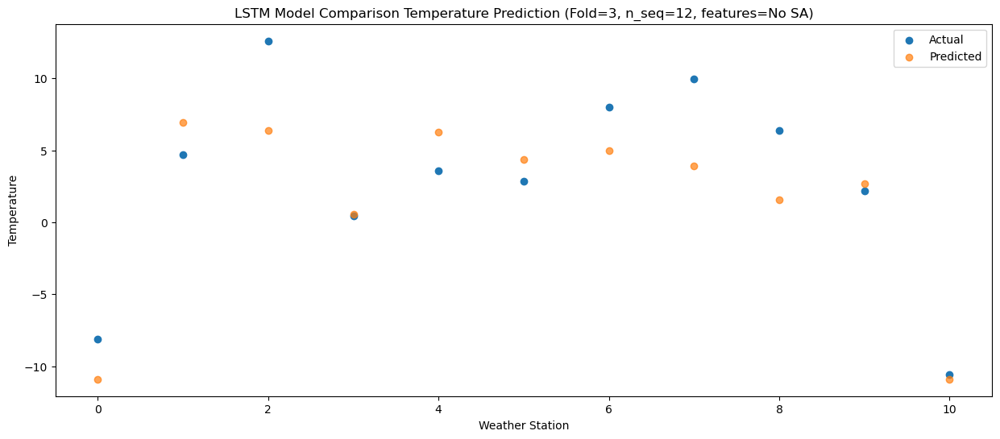

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   -1.35  -3.378646
1                 1   16.67  14.431354
2                 2   13.75  13.901354
3                 3   10.63   8.061354
4                 4   16.64  13.761354
5                 5   14.18  11.881354
6                 6   10.99  12.511354
7                 7   11.57  11.431354
8                 8    6.18   9.111354
9                 9    7.19  10.191354
10               10   -3.41  -3.378646


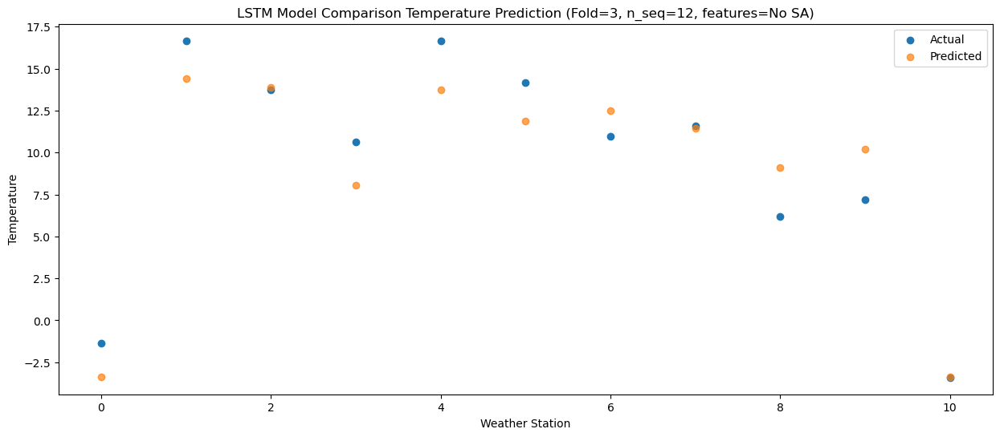

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    1.81  -1.137611
1                 1   18.53  16.672389
2                 2   19.48  16.142389
3                 3   12.98  10.302389
4                 4   19.93  16.002389
5                 5   17.63  14.122389
6                 6   15.77  14.752389
7                 7   19.54  13.672389
8                 8    8.37  11.352389
9                 9   11.81  12.432389
10               10    1.46  -1.137611


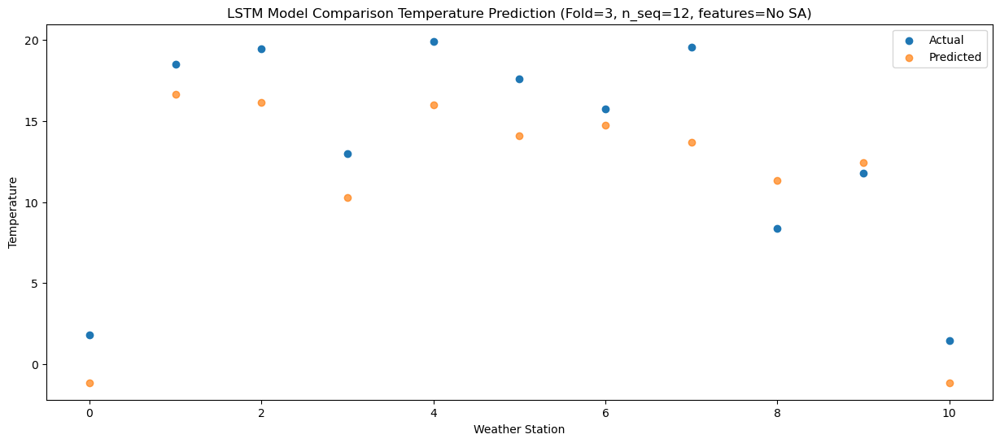

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    5.47   5.076396
1                 1   22.75  22.886396
2                 2   24.28  22.356396
3                 3   17.05  16.516396
4                 4   24.50  22.216396
5                 5   21.91  20.336396
6                 6   20.82  20.966396
7                 7   23.97  19.886396
8                 8   12.66  17.566396
9                 9   16.64  18.646396
10               10    5.72   5.076396


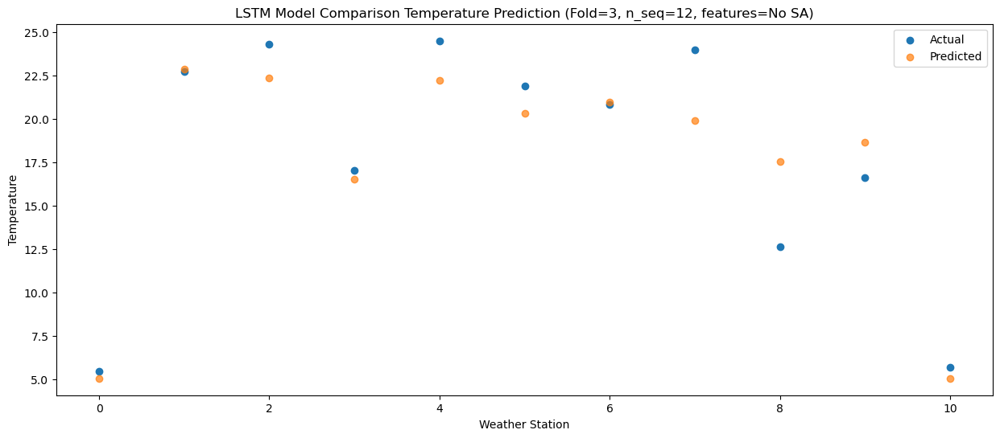

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0    9.53  12.169727
1                 1   29.46  29.979727
2                 2   29.13  29.449727
3                 3   22.97  23.609727
4                 4   31.98  29.309727
5                 5   28.62  27.429727
6                 6   28.21  28.059727
7                 7   31.61  26.979727
8                 8   14.36  24.659727
9                 9   22.51  25.739727
10               10   11.89  12.169727


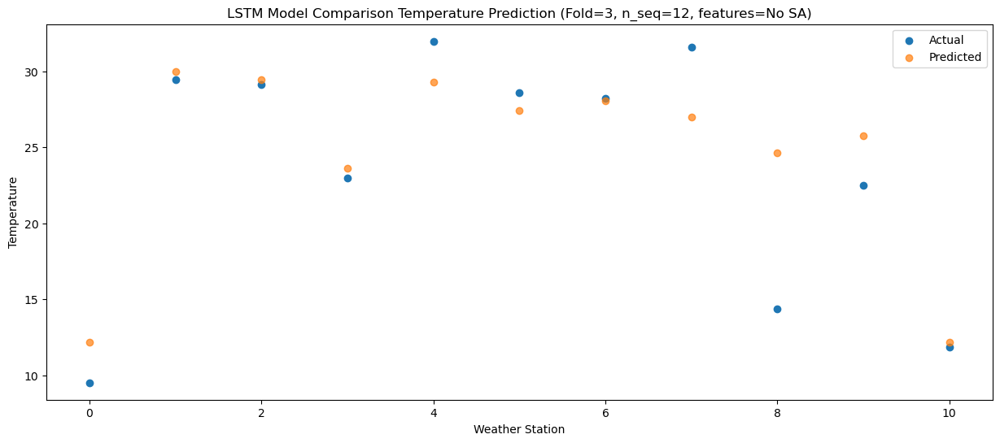

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   11.24  12.963986
1                 1   30.77  30.773986
2                 2   32.26  30.243986
3                 3   23.96  24.403986
4                 4   31.98  30.103986
5                 5   29.00  28.223986
6                 6   30.05  28.853986
7                 7   32.69  27.773986
8                 8   13.54  25.453986
9                 9   24.65  26.533986
10               10   13.53  12.963986


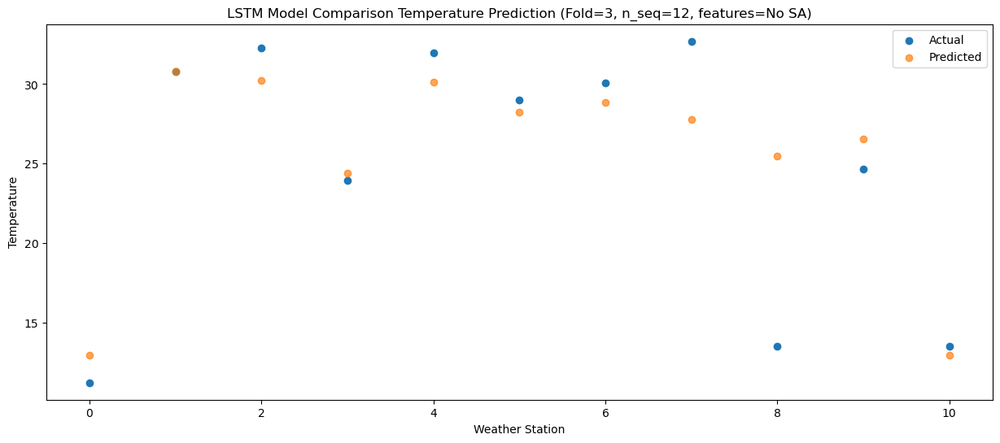

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   11.46  13.616676
1                 1   31.34  31.426676
2                 2   30.06  30.896676
3                 3   24.48  25.056676
4                 4   32.10  30.756676
5                 5   29.32  28.876676
6                 6   28.13  29.506676
7                 7   31.46  28.426676
8                 8   14.09  26.106676
9                 9   25.27  27.186676
10               10   13.26  13.616676


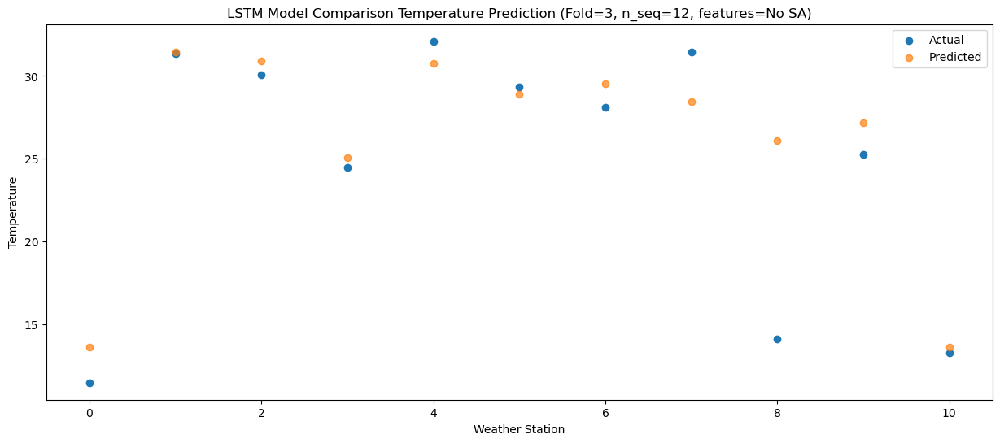

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0    7.47  12.787914
1                 1   28.61  30.597914
2                 2   26.75  30.067914
3                 3   20.35  24.227914
4                 4   28.74  29.927914
5                 5   26.06  28.047914
6                 6   26.26  28.677914
7                 7   27.49  27.597914
8                 8   13.54  25.277914
9                 9   21.95  26.357914
10               10    9.00  12.787914


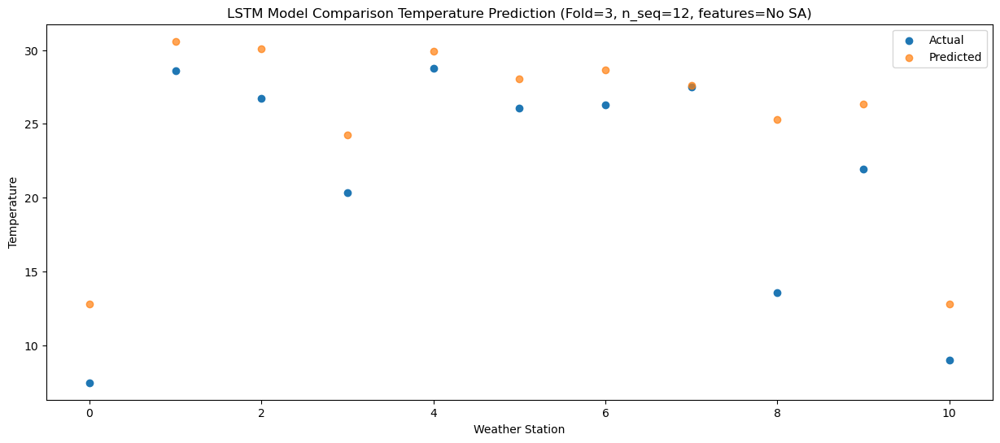

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    4.24   4.633884
1                 1   22.01  22.443884
2                 2   18.09  21.913884
3                 3   16.77  16.073884
4                 4   23.32  21.773884
5                 5   21.48  19.893884
6                 6   18.29  20.523884
7                 7   17.14  19.443884
8                 8   10.78  17.123884
9                 9   17.51  18.203884
10               10    4.88   4.633884


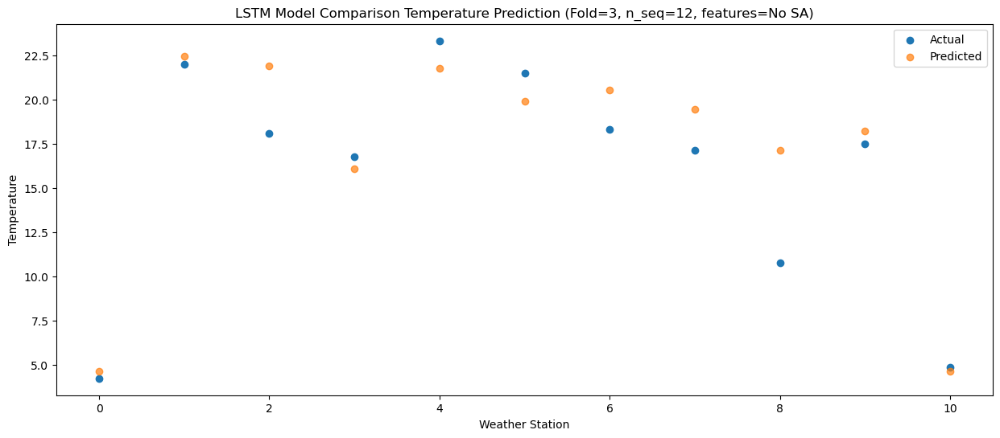

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   -4.52  -2.549776
1                 1   14.30  15.260224
2                 2   13.75  14.730224
3                 3    7.11   8.890224
4                 4   13.58  14.590224
5                 5   10.63  12.710224
6                 6   15.55  13.340224
7                 7   14.62  12.260224
8                 8    7.96   9.940224
9                 9    8.59  11.020224
10               10   -5.34  -2.549776


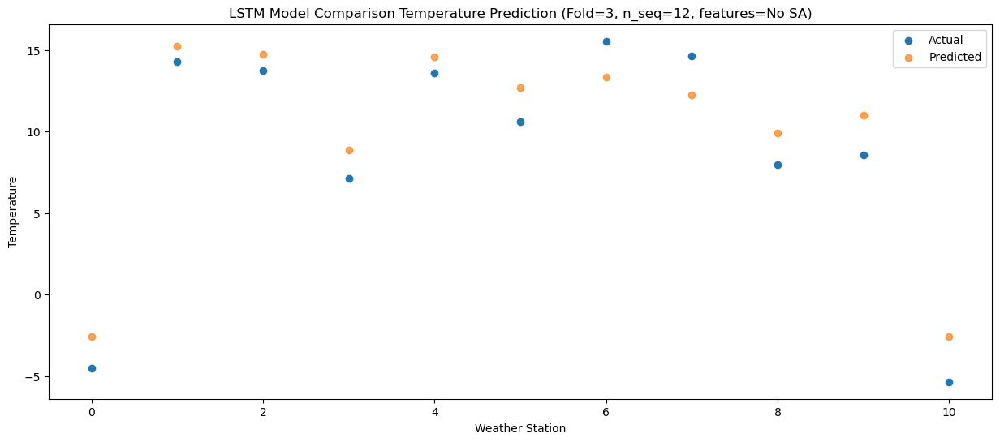

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   -2.56   -4.89369
1                 1   15.61   12.91631
2                 2    9.83   12.38631
3                 3    8.60    6.54631
4                 4   13.22   12.24631
5                 5   11.68   10.36631
6                 6   10.79   10.99631
7                 7    7.35    9.91631
8                 8    4.26    7.59631
9                 9    6.99    8.67631
10               10   -5.75   -4.89369


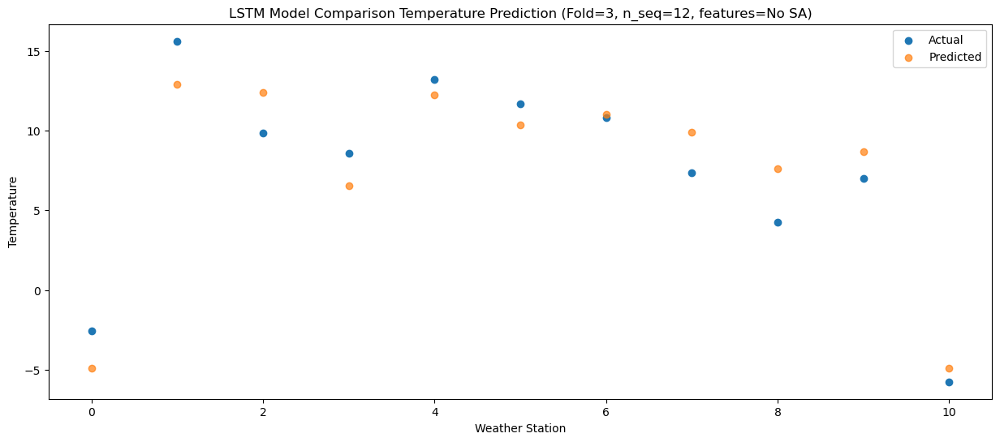

Model: "sequential_506"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1012 (LSTM)            (1, 1, 1024)              12996608  
                                                                 
 dropout_1012 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1013 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1013 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1518 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1519 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1520 (Dense)          (1, 12)                

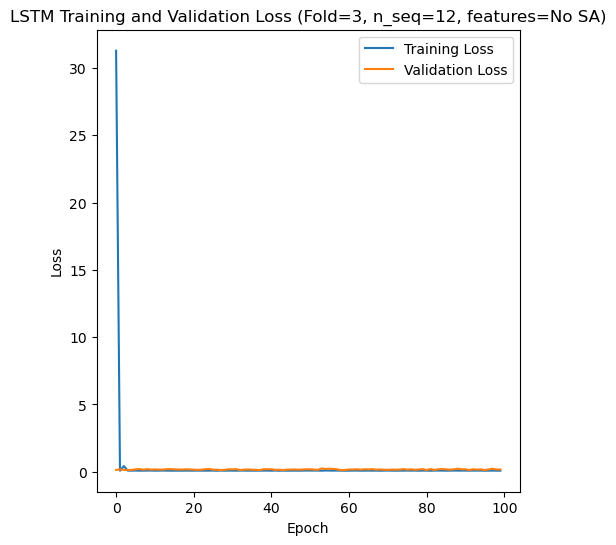

Epoch 1/100
84/84 [==============================] - 10s 79ms/step - loss: 39.1183 - accuracy: 0.3690 - mae: 38.7152 - rmse: 39.1183 - mape: 8345.9082 - pearson: 0.5095 - val_loss: 0.1806 - val_accuracy: 0.0000e+00 - val_mae: 0.1492 - val_rmse: 0.1806 - val_mape: 32.3074 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 5s 62ms/step - loss: 0.0783 - accuracy: 0.6548 - mae: 0.0626 - rmse: 0.0783 - mape: 13.8144 - pearson: 0.7682 - val_loss: 0.1575 - val_accuracy: 0.0000e+00 - val_mae: 0.1243 - val_rmse: 0.1575 - val_mape: 27.4864 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 5s 63ms/step - loss: 0.0818 - accuracy: 0.5952 - mae: 0.0636 - rmse: 0.0818 - mape: 14.2599 - pearson: 0.7560 - val_loss: 0.1310 - val_accuracy: 0.0000e+00 - val_mae: 0.1109 - val_rmse: 0.1310 - val_mape: 24.5794 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 5s 62ms/step - loss: 0.0801 - accuracy: 0.5714 - mae: 0.0627 - rmse: 0.0801 - mape: 14

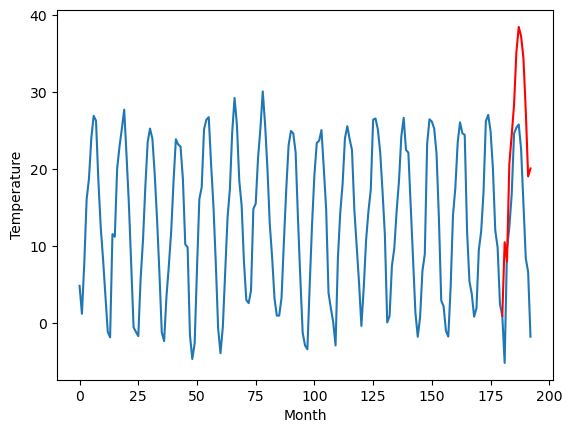

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.34		8.86		0.52
11.77		6.38		-5.39
13.37		19.04		5.67
14.81		22.78		7.97
18.85		26.69		7.84
20.48		33.55		13.07
20.85		36.82		15.97
21.13		35.62		14.49
19.84		32.77		12.93
18.00		25.88		7.88
10.84		17.41		6.57
12.64		18.44		5.80
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.25, 8.864786162376404, 6.3844068193435675, 19.03955723285675, 22.782748713493348, 26.691562428474427, 33.55206133365631, 36.82205225467682, 35.61976875305176, 32.76969017028809, 25.877386226654053, 17.414285793304444, 18.44468809604645]


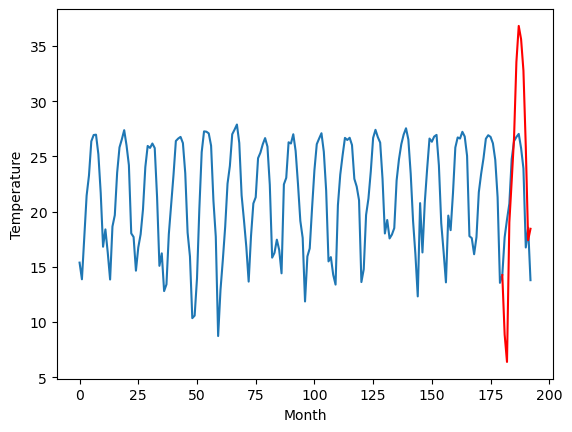

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		5.48		1.19
2.37		3.00		0.63
11.70		15.66		3.96
12.77		19.40		6.63
17.24		23.31		6.07
21.50		30.17		8.67
22.16		33.44		11.28
22.81		32.24		9.43
19.69		29.39		9.70
16.30		22.50		6.20
7.63		14.03		6.40
11.14		15.06		3.92
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.06, 5.484786162376404, 3.0044068193435667, 15.65955723285675, 19.402748713493345, 23.311562428474424, 30.17206133365631, 33.44205225467682, 32.239768753051756, 29.389690170288084, 22.49738622665405, 14.034285793304441, 15.064688096046446]


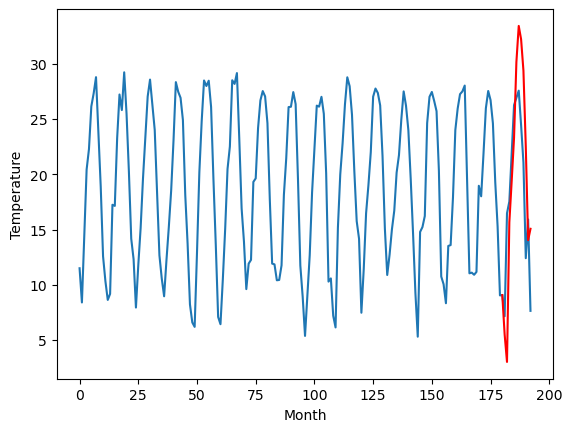

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.70		4.84		2.14
-0.76		2.36		3.12
10.20		15.02		4.82
11.89		18.76		6.87
16.05		22.67		6.62
21.73		29.53		7.80
23.32		32.80		9.48
23.69		31.60		7.91
20.90		28.75		7.85
16.25		21.86		5.61
8.25		13.39		5.14
10.25		14.42		4.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.48, 4.844786162376404, 2.364406819343567, 15.019557232856751, 18.762748713493348, 22.671562428474427, 29.532061333656312, 32.80205225467682, 31.599768753051762, 28.74969017028809, 21.857386226654057, 13.394285793304448, 14.424688096046452]


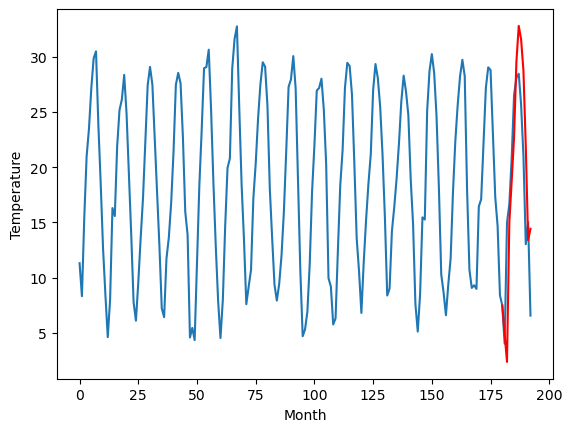

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		6.11		1.82
0.40		3.63		3.23
11.32		16.29		4.97
13.50		20.03		6.53
17.03		23.94		6.91
23.88		30.80		6.92
25.37		34.07		8.70
25.74		32.87		7.13
22.31		30.02		7.71
17.44		23.13		5.69
9.60		14.66		5.06
11.34		15.69		4.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.33, 6.1147861623764035, 3.6344068193435666, 16.28955723285675, 20.032748713493348, 23.941562428474427, 30.80206133365631, 34.07205225467682, 32.86976875305176, 30.019690170288087, 23.127386226654053, 14.664285793304444, 15.694688096046448]


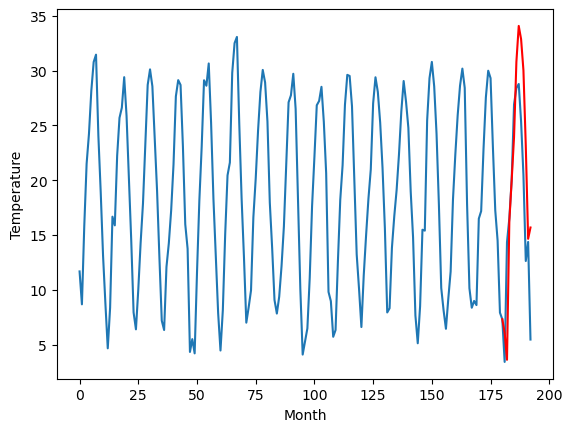

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.28		16.60		2.32
12.71		14.12		1.41
21.96		26.78		4.82
24.19		30.52		6.33
29.68		34.43		4.75
34.64		41.29		6.65
34.38		44.56		10.18
34.70		43.36		8.66
34.01		40.51		6.50
28.31		33.62		5.31
21.37		25.15		3.78
21.78		26.18		4.40
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 16.604786162376406, 14.12440681934357, 26.779557232856753, 30.52274871349335, 34.43156242847443, 41.292061333656314, 44.56205225467682, 43.35976875305176, 40.50969017028809, 33.617386226654055, 25.154285793304446, 26.18468809604645]


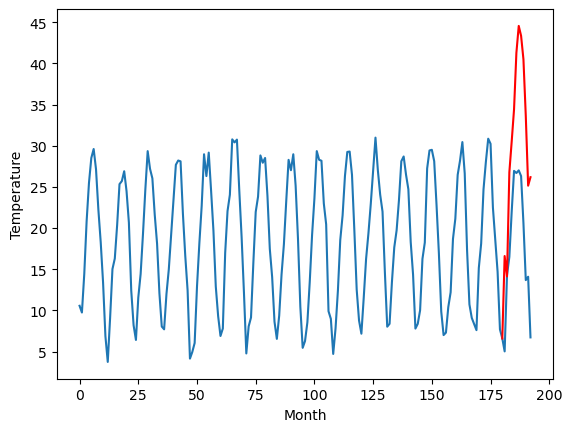

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.72		12.71		0.99
12.39		10.23		-2.16
18.79		22.89		4.10
21.52		26.63		5.11
24.97		30.54		5.57
28.99		37.40		8.41
30.73		40.67		9.94
30.86		39.47		8.61
26.89		36.62		9.73
23.09		29.73		6.64
14.93		21.26		6.33
16.84		22.29		5.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.04, 12.714786162376404, 10.234406819343567, 22.889557232856752, 26.63274871349335, 30.54156242847443, 37.40206133365631, 40.67205225467682, 39.46976875305176, 36.61969017028809, 29.727386226654055, 21.264285793304445, 22.29468809604645]


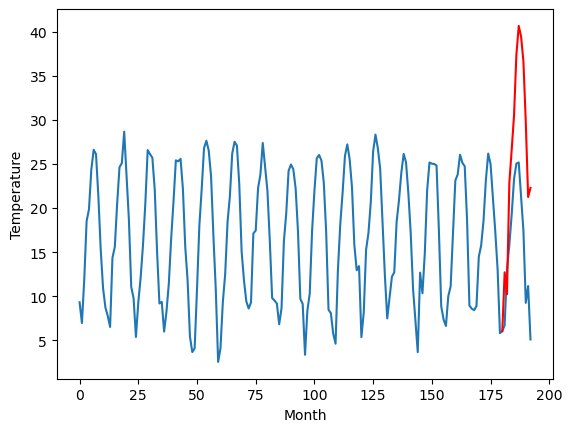

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.64		12.53		2.89
6.03		10.05		4.02
18.30		22.71		4.41
20.20		26.45		6.25
24.24		30.36		6.12
30.54		37.22		6.68
31.83		40.49		8.66
32.35		39.29		6.94
29.31		36.44		7.13
23.54		29.55		6.01
15.60		21.08		5.48
17.06		22.11		5.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.13, 12.534786162376404, 10.054406819343567, 22.709557232856753, 26.45274871349335, 30.36156242847443, 37.22206133365631, 40.49205225467682, 39.28976875305176, 36.43969017028809, 29.547386226654055, 21.084285793304446, 22.11468809604645]


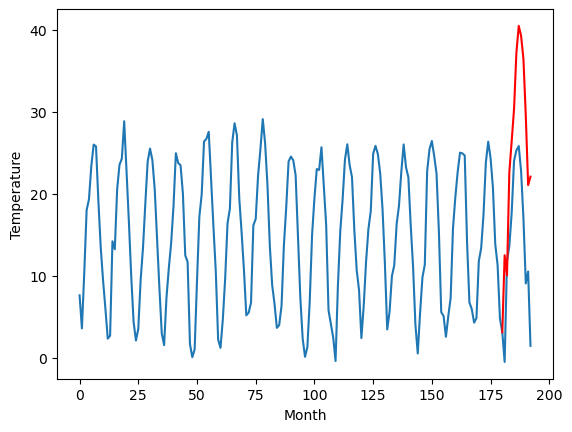

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.11		12.91		2.80
6.75		10.43		3.68
18.72		23.09		4.37
22.37		26.83		4.46
26.78		30.74		3.96
34.02		37.60		3.58
34.59		40.87		6.28
35.45		39.67		4.22
31.96		36.82		4.86
26.61		29.93		3.32
15.75		21.46		5.71
16.07		22.49		6.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.29, 12.914786162376403, 10.434406819343566, 23.089557232856748, 26.832748713493345, 30.741562428474424, 37.60206133365631, 40.87205225467682, 39.669768753051756, 36.819690170288084, 29.92738622665405, 21.46428579330444, 22.494688096046445]


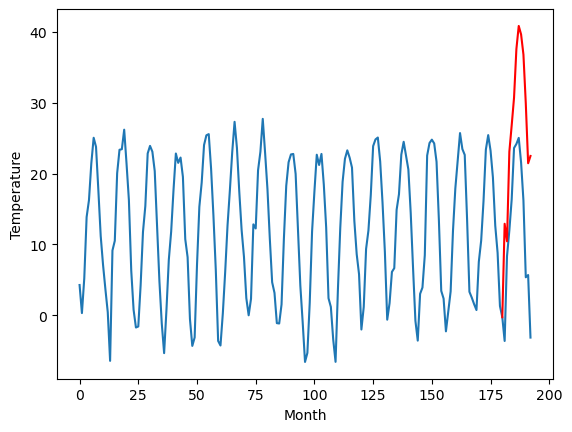

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		11.78		3.25
4.09		9.30		5.21
17.95		21.96		4.01
21.66		25.70		4.04
26.44		29.61		3.17
33.83		36.47		2.64
33.54		39.74		6.20
33.82		38.54		4.72
30.71		35.69		4.98
25.25		28.80		3.55
14.94		20.33		5.39
14.69		21.36		6.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-1.03, 11.784786162376404, 9.304406819343567, 21.959557232856753, 25.70274871349335, 29.61156242847443, 36.47206133365631, 39.74205225467682, 38.53976875305176, 35.68969017028809, 28.797386226654055, 20.334285793304446, 21.36468809604645]


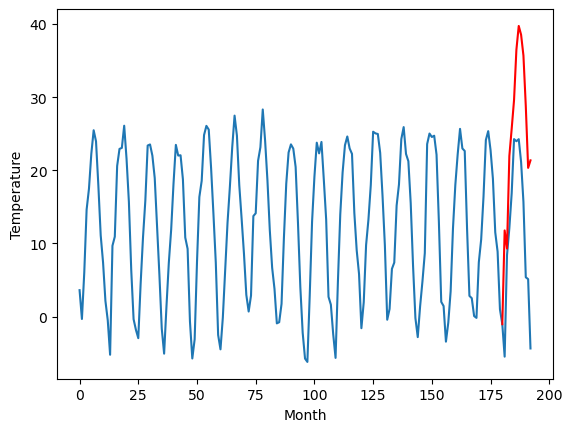

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.40		10.54		3.14
5.16		8.06		2.90
15.05		20.72		5.67
18.85		24.46		5.61
23.38		28.37		4.99
30.27		35.23		4.96
30.43		38.50		8.07
31.63		37.30		5.67
27.34		34.45		7.11
23.81		27.56		3.75
13.41		19.09		5.68
12.55		20.12		7.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-2.29, 10.544786162376404, 8.064406819343567, 20.71955723285675, 24.462748713493347, 28.371562428474427, 35.23206133365631, 38.50205225467682, 37.29976875305176, 34.449690170288086, 27.557386226654053, 19.094285793304444, 20.124688096046448]


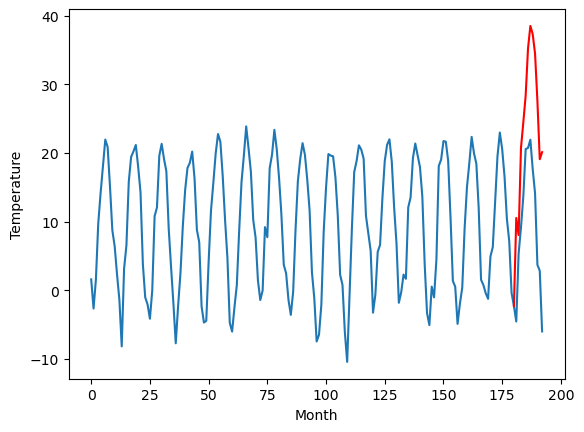

RangeIndex(start=1, stop=12, step=1)
[7.810000000000001, 8.339999999999998, 4.290000000000002, 2.7000000000000006, 4.289999999999999, 14.280000000000001, 11.719999999999999, 9.64, 10.11, 8.53, 7.4]
[10.544786162376404, 8.864786162376404, 5.484786162376404, 4.844786162376404, 6.1147861623764035, 16.604786162376406, 12.714786162376404, 12.534786162376404, 12.914786162376403, 11.784786162376404, 10.544786162376404]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.81  10.544786
1                 1    8.34   8.864786
2                 2    4.29   5.484786
3                 3    2.70   4.844786
4                 4    4.29   6.114786
5                 5   14.28  16.604786
6                 6   11.72  12.714786
7                 7    9.64  12.534786
8                 8   10.11  12.914786
9                 9    8.53  11.784786
10               10    7.40  10.544786


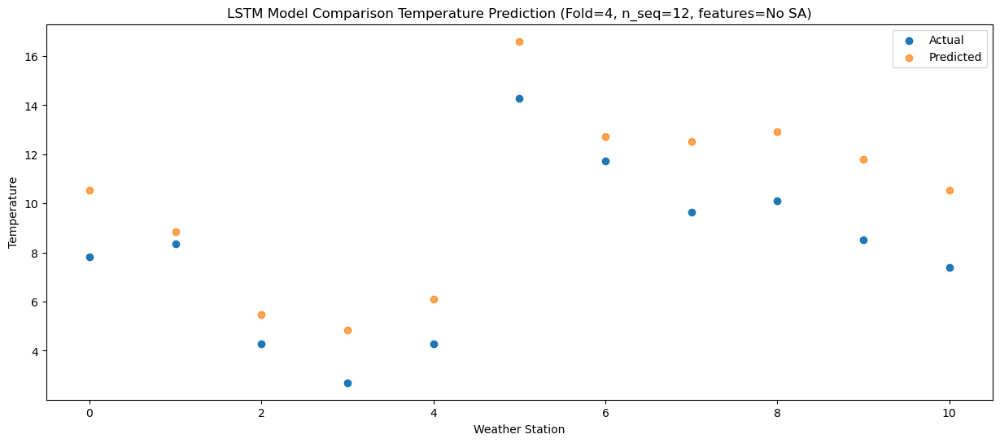

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.68   8.064407
1                 1   11.77   6.384407
2                 2    2.37   3.004407
3                 3   -0.76   2.364407
4                 4    0.40   3.634407
5                 5   12.71  14.124407
6                 6   12.39  10.234407
7                 7    6.03  10.054407
8                 8    6.75  10.434407
9                 9    4.09   9.304407
10               10    5.16   8.064407


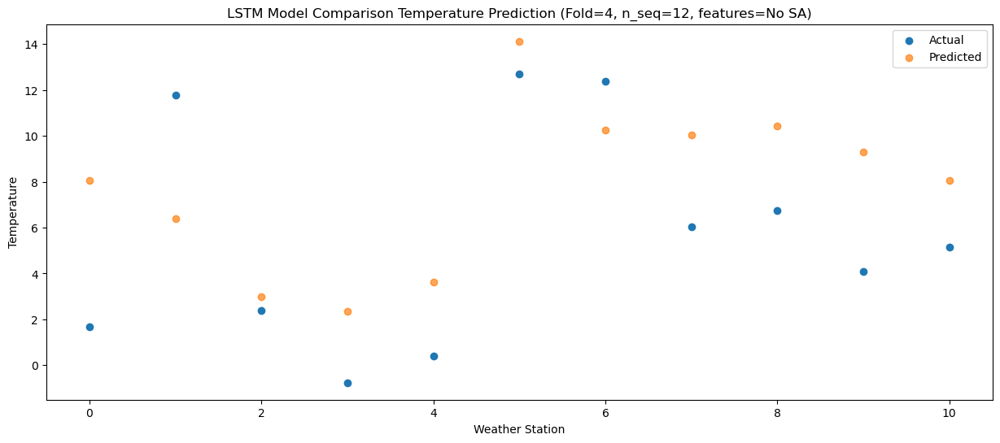

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.41  20.719557
1                 1   13.37  19.039557
2                 2   11.70  15.659557
3                 3   10.20  15.019557
4                 4   11.32  16.289557
5                 5   21.96  26.779557
6                 6   18.79  22.889557
7                 7   18.30  22.709557
8                 8   18.72  23.089557
9                 9   17.95  21.959557
10               10   15.05  20.719557


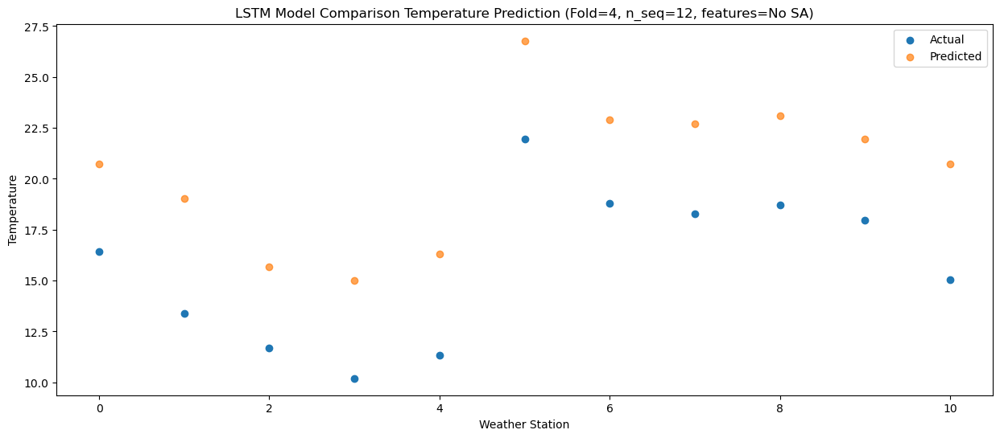

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   19.32  24.462749
1                 1   14.81  22.782749
2                 2   12.77  19.402749
3                 3   11.89  18.762749
4                 4   13.50  20.032749
5                 5   24.19  30.522749
6                 6   21.52  26.632749
7                 7   20.20  26.452749
8                 8   22.37  26.832749
9                 9   21.66  25.702749
10               10   18.85  24.462749


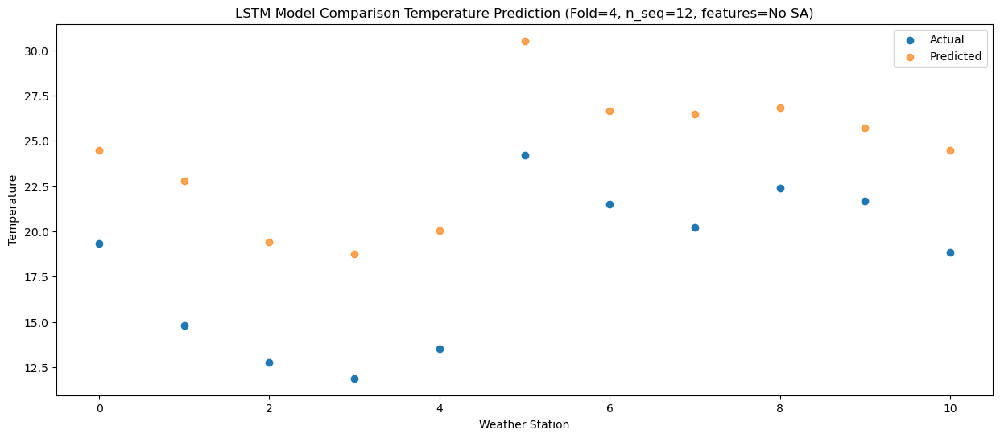

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   23.53  28.371562
1                 1   18.85  26.691562
2                 2   17.24  23.311562
3                 3   16.05  22.671562
4                 4   17.03  23.941562
5                 5   29.68  34.431562
6                 6   24.97  30.541562
7                 7   24.24  30.361562
8                 8   26.78  30.741562
9                 9   26.44  29.611562
10               10   23.38  28.371562


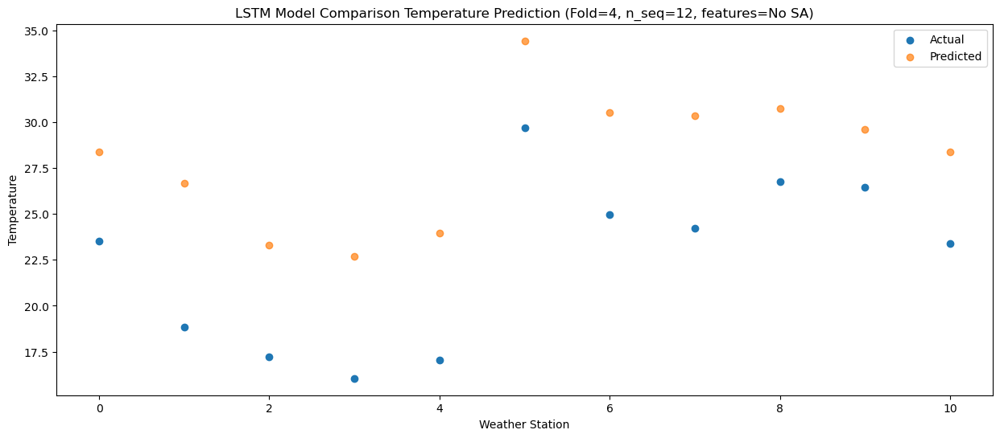

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   31.44  35.232061
1                 1   20.48  33.552061
2                 2   21.50  30.172061
3                 3   21.73  29.532061
4                 4   23.88  30.802061
5                 5   34.64  41.292061
6                 6   28.99  37.402061
7                 7   30.54  37.222061
8                 8   34.02  37.602061
9                 9   33.83  36.472061
10               10   30.27  35.232061


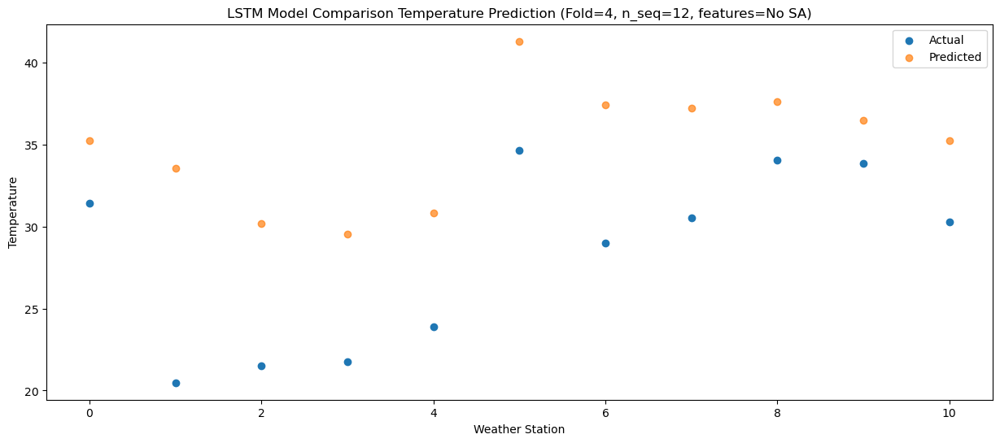

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   32.24  38.502052
1                 1   20.85  36.822052
2                 2   22.16  33.442052
3                 3   23.32  32.802052
4                 4   25.37  34.072052
5                 5   34.38  44.562052
6                 6   30.73  40.672052
7                 7   31.83  40.492052
8                 8   34.59  40.872052
9                 9   33.54  39.742052
10               10   30.43  38.502052


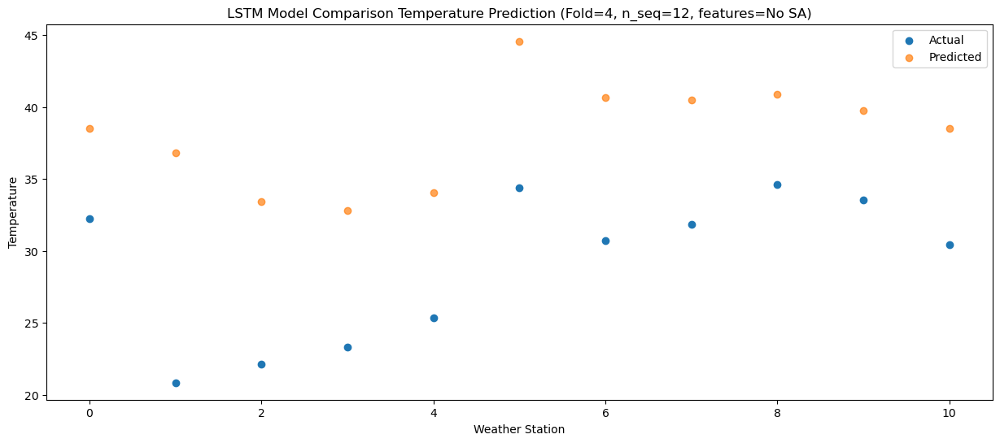

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   32.64  37.299769
1                 1   21.13  35.619769
2                 2   22.81  32.239769
3                 3   23.69  31.599769
4                 4   25.74  32.869769
5                 5   34.70  43.359769
6                 6   30.86  39.469769
7                 7   32.35  39.289769
8                 8   35.45  39.669769
9                 9   33.82  38.539769
10               10   31.63  37.299769


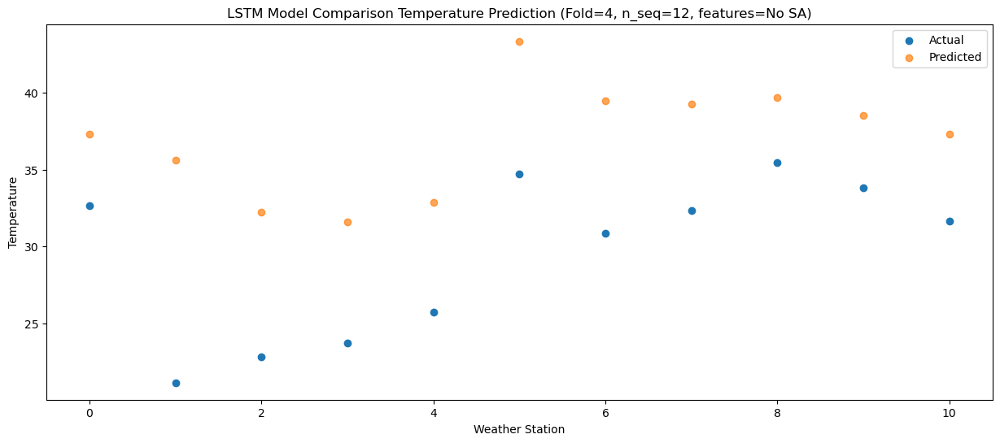

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   29.45   34.44969
1                 1   19.84   32.76969
2                 2   19.69   29.38969
3                 3   20.90   28.74969
4                 4   22.31   30.01969
5                 5   34.01   40.50969
6                 6   26.89   36.61969
7                 7   29.31   36.43969
8                 8   31.96   36.81969
9                 9   30.71   35.68969
10               10   27.34   34.44969


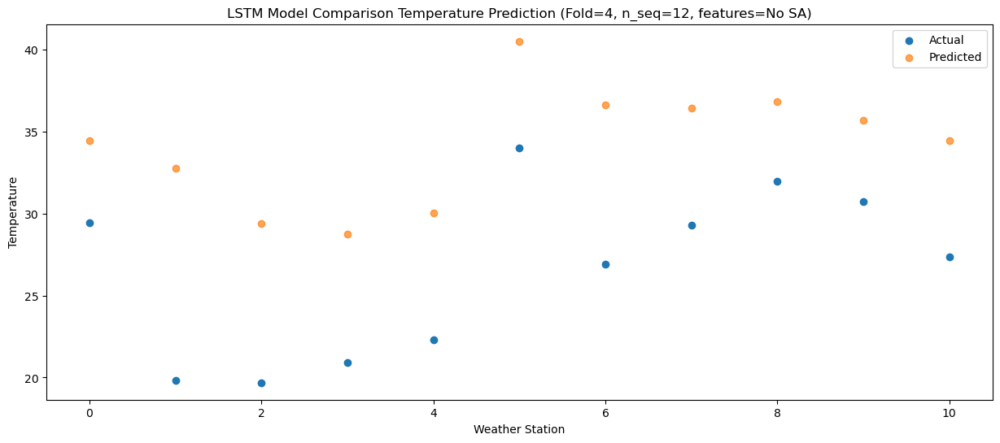

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   22.32  27.557386
1                 1   18.00  25.877386
2                 2   16.30  22.497386
3                 3   16.25  21.857386
4                 4   17.44  23.127386
5                 5   28.31  33.617386
6                 6   23.09  29.727386
7                 7   23.54  29.547386
8                 8   26.61  29.927386
9                 9   25.25  28.797386
10               10   23.81  27.557386


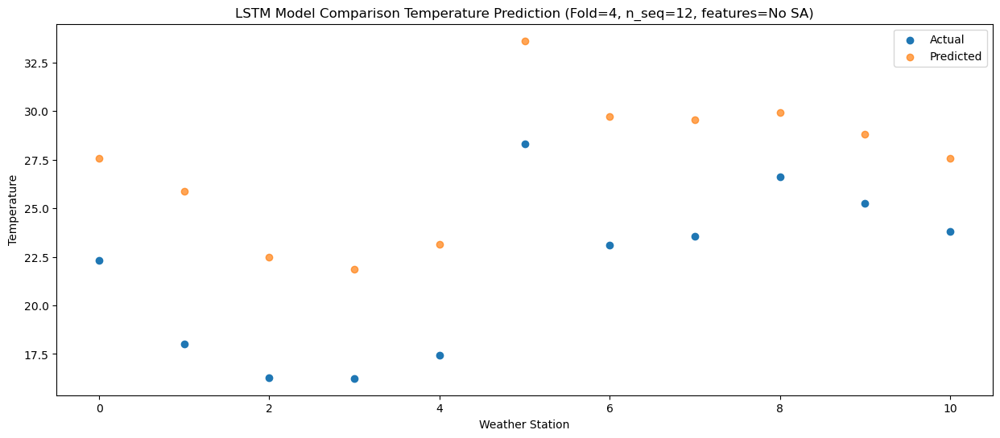

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   15.26  19.094286
1                 1   10.84  17.414286
2                 2    7.63  14.034286
3                 3    8.25  13.394286
4                 4    9.60  14.664286
5                 5   21.37  25.154286
6                 6   14.93  21.264286
7                 7   15.60  21.084286
8                 8   15.75  21.464286
9                 9   14.94  20.334286
10               10   13.41  19.094286


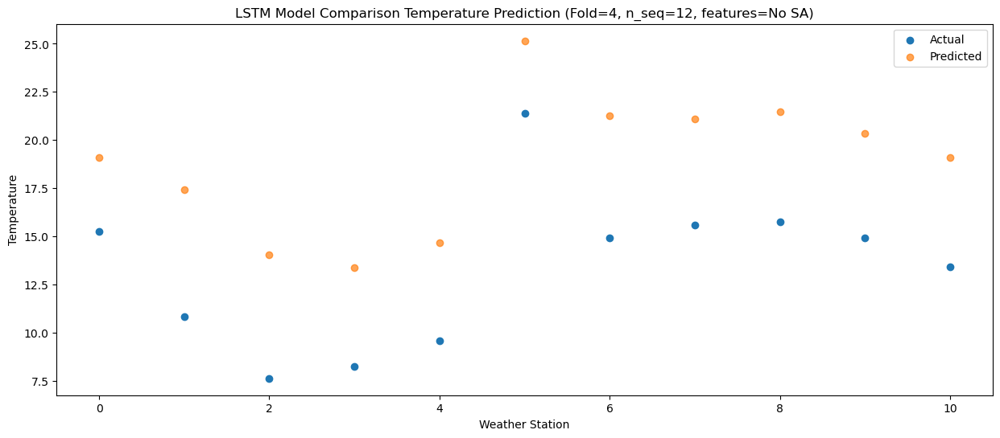

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   13.47  20.124688
1                 1   12.64  18.444688
2                 2   11.14  15.064688
3                 3   10.25  14.424688
4                 4   11.34  15.694688
5                 5   21.78  26.184688
6                 6   16.84  22.294688
7                 7   17.06  22.114688
8                 8   16.07  22.494688
9                 9   14.69  21.364688
10               10   12.55  20.124688


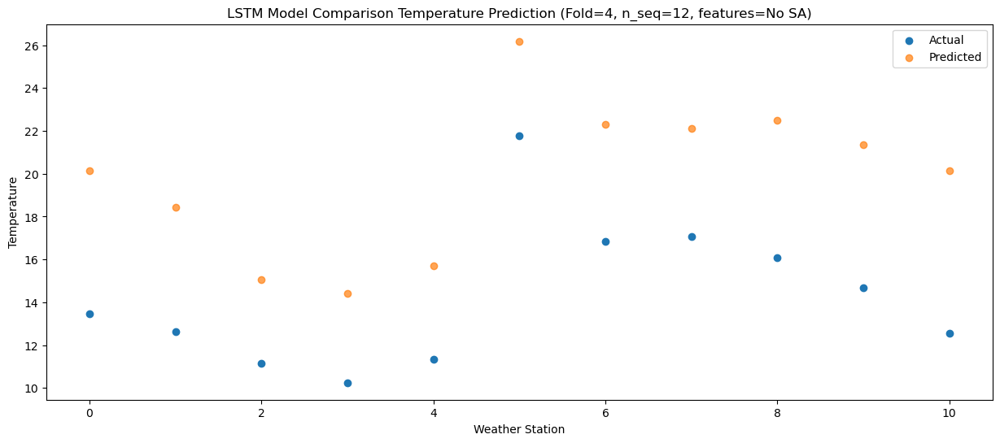

Model: "sequential_507"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1014 (LSTM)            (1, 1, 1024)              12996608  
                                                                 
 dropout_1014 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1015 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1015 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1521 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1522 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1523 (Dense)          (1, 12)                

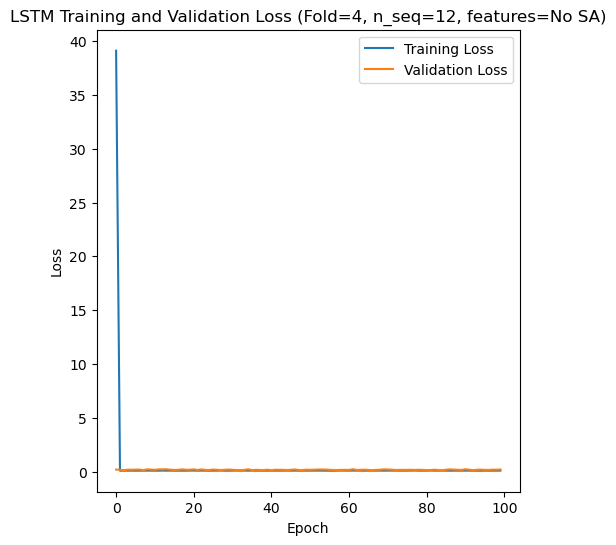

[[2.551707174007661, 3.155100376242102, 2.04438950703619, 4.032373802954749, 6.443118067856342, 6.876532877830043, 6.282174145192752, 7.681241780122016, 5.889228135683569, 3.817608007482346, 6.645455403347441, 4.727951401656555], [1.376667132958423, 2.188772982118446, 3.1914474597189435, 0.6570521603250002, 1.7953056878643054, 4.42348201226489, 5.4109658094454876, 4.205487372314718, 3.280505659553654, 1.6498903569200927, 2.444395283183034, 1.2746156284932972], [1.1653784197791148, 3.66707101766955, 2.8408030040792625, 2.8371889363248752, 3.2773829154607608, 4.982219727943508, 3.6078543866607693, 3.616250544812499, 3.4455863989666504, 2.3381456810468118, 2.196091499803325, 4.120652661501347], [1.3194114261340142, 3.439500664537709, 2.1160394085486804, 3.157556965925595, 2.2775468711279676, 3.7459386999819912, 4.076157802111973, 3.8962693915946263, 4.681261362565342, 2.548463641207276, 1.9620492850392561, 2.0772507179398705], [2.340086975592662, 3.8427557786708304, 4.68179299859949, 6.00

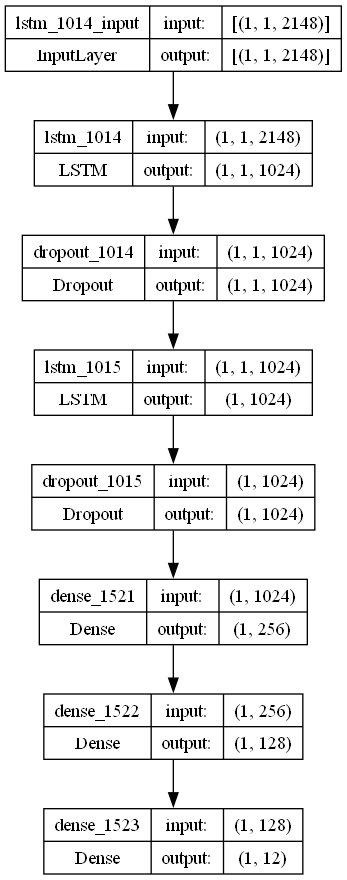

In [12]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr = 0.1567577714053969
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.24744236008780432

    # design network
    model = Sequential()
    #model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with an LSTM,
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S12.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)